<a href="https://colab.research.google.com/github/FabianBoro/strokedetection_snn_ga/blob/main/SNN_GA_strokeTraining.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## instalasi

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
!pip uninstall torch

Found existing installation: torch 2.2.1+cu121
Uninstalling torch-2.2.1+cu121:
  Would remove:
    /usr/local/bin/convert-caffe2-to-onnx
    /usr/local/bin/convert-onnx-to-caffe2
    /usr/local/bin/torchrun
    /usr/local/lib/python3.10/dist-packages/functorch/*
    /usr/local/lib/python3.10/dist-packages/torch-2.2.1+cu121.dist-info/*
    /usr/local/lib/python3.10/dist-packages/torch/*
    /usr/local/lib/python3.10/dist-packages/torchgen/*
Proceed (Y/n)? Y
  Successfully uninstalled torch-2.2.1+cu121


In [ ]:
!pip install -qU git+https://github.com/norse/norse

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.2/76.2 kB 2.5 MB/s eta 0:00:00


In [ ]:
# !pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

In [ ]:
import sys
print(sys.version)


3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]


In [ ]:
from norse.torch.functional import (
    lif_step,
    lift,
    lif_feed_forward_step,
    lif_current_encoder,
    LIFParameters,
)

N = 1  # number of neurons to consider
T = 100  # number of timesteps to integrate

p = LIFParameters()
v = torch.zeros(N)  # initial membrane voltage
input_current = 1.1 * torch.ones(N)

voltages = []

for ts in range(T):
    z, v = lif_current_encoder(input_current, v, p)
    voltages.append(v)

voltages = torch.stack(voltages)

In [ ]:
import torch
print(torch.__version__)


2.2.1+cu121


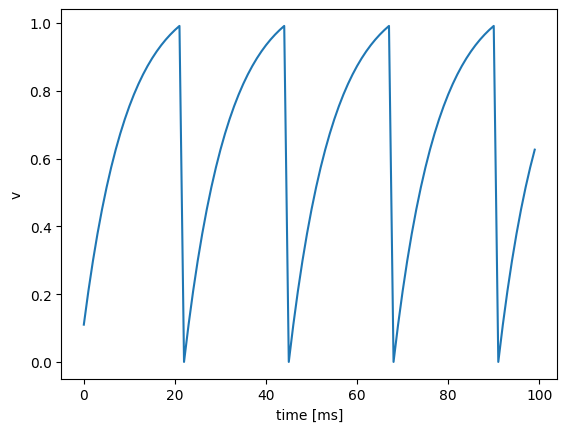

In [ ]:
plt.ylabel("v")
plt.xlabel("time [ms]")
plt.plot(voltages)

Diatas merupakan implementasi dari model neuron Spiking Neural Network (SNN) menggunakan LIF (Leaky Integrate-and-Fire) neuron model. Grafik menunjukkan perubahan membran potensial neuron terhadap waktu. Garis pada grafik merepresentasikan nilai membran potensial neuron pada setiap langkah waktu. Ini memberikan gambaran visual tentang bagaimana neuron bereaksi terhadap arus masukan selama waktu simulasi.



## Pengolahan dataset

In [ ]:
import os
import zipfile
import tensorflow as tf

# Download dataset from GitHub
url = "https://github.com/FabianBoro/strokedetection_snn_ga/releases/download/v0.1.0-dataset-ctscan-for-stroke/dataset-for-stroke-classification.zip"
filename = os.path.join(os.getcwd(), "brain_ct_data.zip")
tf.keras.utils.get_file(filename, url)

# Unzip dataset
with zipfile.ZipFile("brain_ct_data.zip", "r") as z_fp:
    z_fp.extractall(".")


17444156/17444156 [==============================] - 0s 0us/step


In [ ]:
# Define paths to the extracted dataset
dataset_dir = os.path.join(os.getcwd(), "dataset-for-stroke-classification")

# Explore the dataset structure
for root, dirs, files in os.walk(dataset_dir):
    print(f"Folder: {root}")
    print(f"Files: {files}\n")
    print("\n")



Folder: /content/dataset-for-stroke-classification
Files: []



Folder: /content/dataset-for-stroke-classification/haemorrhagic-stroke
Files: ['cerebellar-haemorrhage-5 (1).png', 'intracerebral-haemorrhage-8 (9).jpg', 'haemorrhagic-stroke-1 (15).png', 'haemorrhagic-stroke-1 (2).png', 'intracerebral-haemorrhage-8 (18).jpg', 'haemorrhagic-stroke-1 (24).png', 'cerebellar-haemorrhage-5 (13).png', 'intracerebral-haemorrhage-8 (21).jpg', 'intracerebral-haemorrhage-8 (24).jpg', 'cerebellar-haemorrhage-5 (11).png', 'haemorrhagic-stroke-1 (20).png', 'cerebellar-haemorrhage-5 (27).png', 'haemorrhagic-stroke-1 (29).png', 'cerebellar-haemorrhage-5 (4).png', 'intracerebral-haemorrhage-8 (3).jpg', 'intracerebral-haemorrhage-8 (11).jpg', 'haemorrhagic-stroke-1 (19).png', 'intracerebral-haemorrhage-8 (7).jpg', 'haemorrhagic-stroke-1 (26).png', 'cerebellar-haemorrhage-5 (24).png', 'cerebellar-haemorrhage-5 (12).png', 'cerebellar-haemorrhage-5 (10).png', 'haemorrhagic-stroke-1 (6).png', 'intracerebral-h

Kemudian dilanjutkan untuk menampilkan dataset yang akan kita gunakan

Category: haemorrhagic-stroke
Number of images: 90


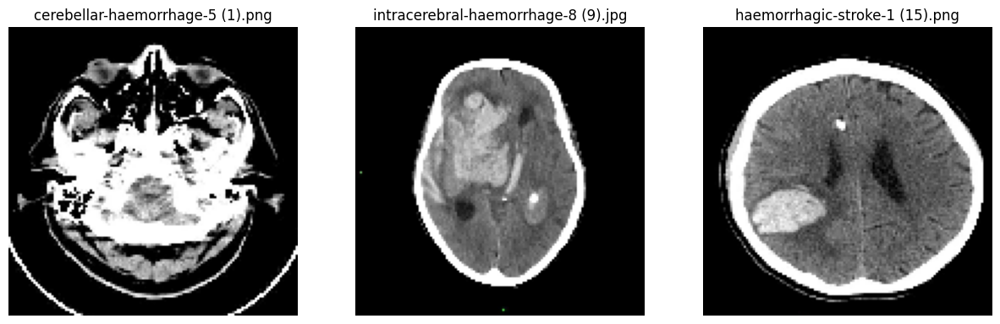



Category: ischemic-stroke
Number of images: 90


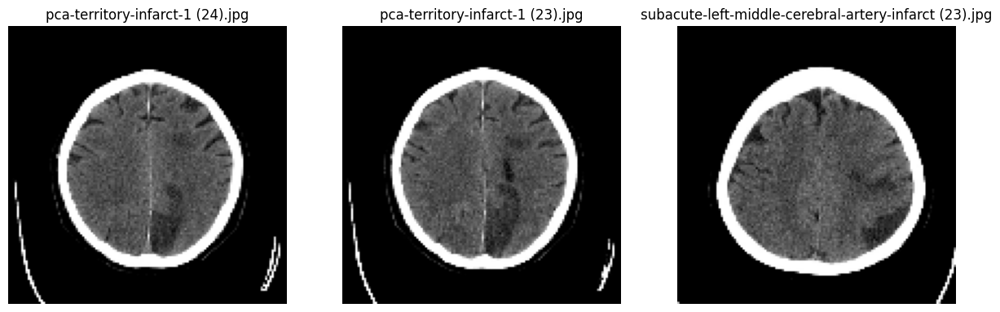



Category: normal
Number of images: 90


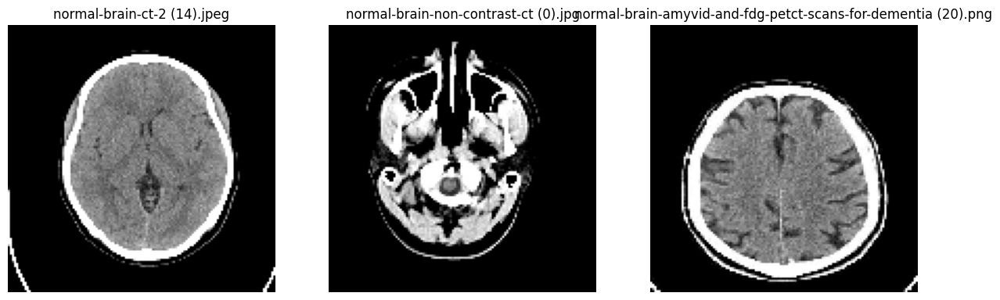

In [ ]:
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Path to the extracted dataset
dataset_dir = "/content/dataset-for-stroke-classification"

# Function to display images
def display_images(image_paths, titles, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
    for i, ax in enumerate(axes.flat):
        img = image.load_img(image_paths[i], target_size=(128, 128))
        ax.imshow(img)
        ax.set_title(titles[i])
        ax.axis('off')
    plt.show()

# Display some information about the dataset
for category in os.listdir(dataset_dir):
    category_path = os.path.join(dataset_dir, category)
    print(f"Category: {category}")
    print(f"Number of images: {len(os.listdir(category_path))}")

    # Display a few sample images
    sample_images = os.listdir(category_path)[:3]
    sample_paths = [os.path.join(category_path, img) for img in sample_images]
    display_images(sample_paths, sample_images, 1, 3)
    print("\n")


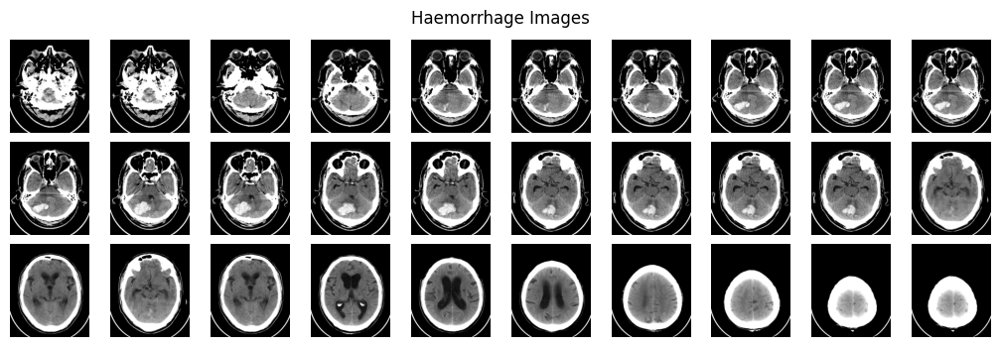

In [ ]:
import os
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import numpy as np

def plot_haemorrhage_images(folder_path):
    """Plot 30 slices for the 'haemorrhage' category."""
    num_rows = 3
    num_columns = 10
    factor = 1
    f, axarr = plt.subplots(
        num_rows,
        num_columns,
        figsize=(num_columns * factor, num_rows * factor),
    )
    f.suptitle("Haemorrhage Images", y=1.1)
    image_id = 0
    for i in range(num_rows):
        for j in range(num_columns):
            image_path = os.path.join(folder_path, f'cerebellar-haemorrhage-5 ({image_id}).png')
            try:
                img = imageio.imread(image_path)
            except Exception as e:
                print(f"Error loading image {image_path}: {e}")
                img = np.zeros((2, 2))
            finally:
                axarr[i, j].imshow(img, cmap='gray')
                axarr[i, j].axis('off')
                image_id += 1
    plt.subplots_adjust(wspace=0.1, hspace=0.1, left=0, right=1, bottom=0, top=1)
    plt.show()

# Set the path to the 'haemorrhage' category
haemorrhage_path = "/content/dataset-for-stroke-classification/haemorrhagic-stroke"

# Call the function to plot the haemorrhage images
plot_haemorrhage_images(haemorrhage_path)


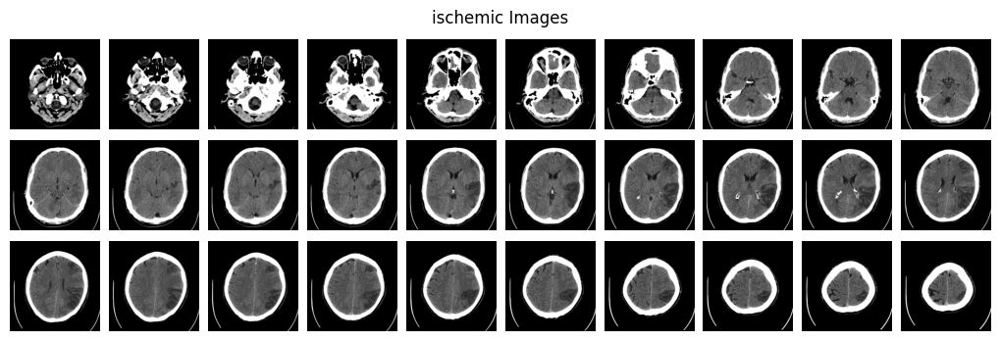

In [ ]:
import os
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import numpy as np

def plot_ischemic_path_images(folder_path):
    """Plot 30 slices for the 'haemorrhage' category."""
    num_rows = 3
    num_columns = 10
    factor = 1
    f, axarr = plt.subplots(
        num_rows,
        num_columns,
        figsize=(num_columns * factor, num_rows * factor),
    )
    f.suptitle("ischemic Images", y=1.1)
    image_id = 0
    for i in range(num_rows):
        for j in range(num_columns):
            image_path = os.path.join(folder_path, f'ischemic-stroke-2 ({image_id}).jpg')
            try:
                img = imageio.imread(image_path)
            except Exception as e:
                print(f"Error loading image {image_path}: {e}")
                img = np.zeros((2, 2))
            finally:
                axarr[i, j].imshow(img, cmap='gray')
                axarr[i, j].axis('off')
                image_id += 1
    plt.subplots_adjust(wspace=0.1, hspace=0.1, left=0, right=1, bottom=0, top=1)
    plt.show()

# Set the path to the 'haemorrhage' category
ischemic_path = "/content/dataset-for-stroke-classification/ischemic-stroke"

# Call the function to plot the haemorrhage images
plot_ischemic_path_images(ischemic_path)


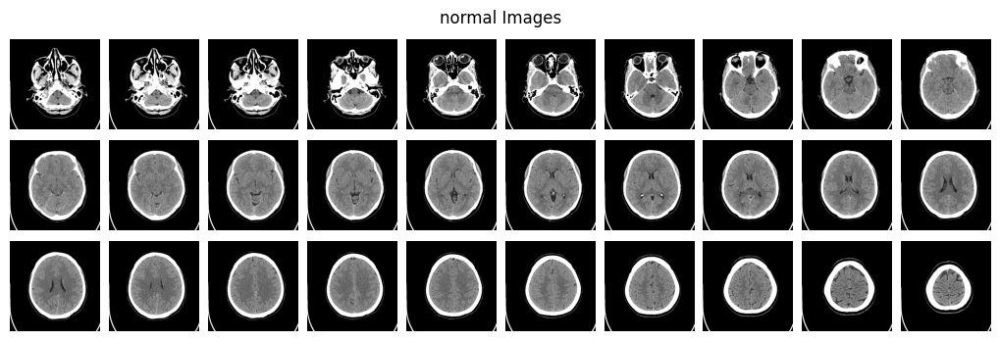

In [ ]:
import os
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import numpy as np

def plot_normal_path_images(folder_path):
    """Plot 30 slices for the 'haemorrhage' category."""
    num_rows = 3
    num_columns = 10
    factor = 1
    f, axarr = plt.subplots(
        num_rows,
        num_columns,
        figsize=(num_columns * factor, num_rows * factor),
    )
    f.suptitle("normal Images", y=1.1)
    image_id = 0
    for i in range(num_rows):
        for j in range(num_columns):
            image_path = os.path.join(folder_path, f'normal-brain-ct-2 ({image_id}).jpeg')
            try:
                img = imageio.imread(image_path)
            except Exception as e:
                print(f"Error loading image {image_path}: {e}")
                img = np.zeros((2, 2))
            finally:
                axarr[i, j].imshow(img, cmap='gray')
                axarr[i, j].axis('off')
                image_id += 1
    plt.subplots_adjust(wspace=0.1, hspace=0.1, left=0, right=1, bottom=0, top=1)
    plt.show()

# Set the path to the 'haemorrhage' category
normal_path = "/content/dataset-for-stroke-classification/normal"

# Call the function to plot the haemorrhage images
plot_normal_path_images(normal_path)


Selanjutnya kita akan melakukan pre processing data dengan melakukan augmentasi data citra. Augmentasi akan dilakukan dengan beberapa proses pengolahan citra yaitu resize, rotate, crop, kemudian ada juga metode untuk menghapus latar belakang atau noise yang terlihat pada citra.

In [ ]:
from PIL import Image
import os

def resize_crop_and_convert_to_jpg(input_folder, output_folder, target_size=(128, 128)):
    os.makedirs(output_folder, exist_ok=True)

    for category in os.listdir(input_folder):
        category_path = os.path.join(input_folder, category)
        output_category_path = os.path.join(output_folder, category)
        os.makedirs(output_category_path, exist_ok=True)

        for filename in os.listdir(category_path):
            input_path = os.path.join(category_path, filename)
            output_path = os.path.join(output_category_path, filename.split('.')[0] + '.jpg')

            try:
                img = Image.open(input_path)

                # Check if the image is not square
                if img.width != img.height:
                    # Crop to make it square by trimming top and bottom
                    min_side = min(img.width, img.height)
                    left = 0
                    top = (img.height - min_side) // 2
                    right = min_side
                    bottom = top + min_side
                    img = img.crop((left, top, right, bottom))

                # Resize to the target size
                img = img.resize(target_size, Image.LANCZOS)

                # Convert and save as .jpg
                img = img.convert('L')
                img.save(output_path, format='JPEG')
            except Exception as e:
                print(f"Error processing {input_path}: {e}")

# Set the input and output paths
input_dataset_path = "/content/dataset-for-stroke-classification"
output_resized_path = "/content/resized-dataset-preprocess"

# Call the function to resize, crop, and convert images to jpg
resize_crop_and_convert_to_jpg(input_dataset_path, output_resized_path)


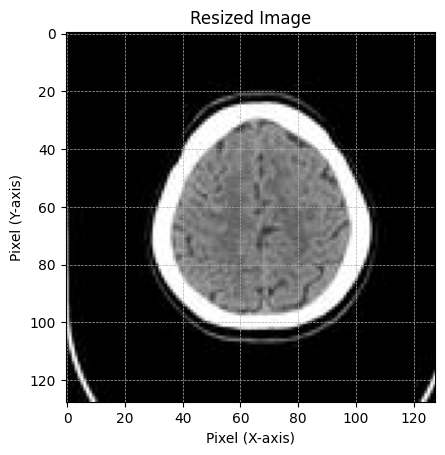

In [ ]:
from PIL import Image
import os
import matplotlib.pyplot as plt

def display_image_with_axes(image_path):
    try:
        img = Image.open(image_path)

        if img is None:
            raise Exception("Image not loaded successfully.")

        plt.imshow(img, cmap='gray')
        plt.title("Resized Image")
        plt.xlabel("Pixel (X-axis)")
        plt.ylabel("Pixel (Y-axis)")
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.show()

    except Exception as e:
        print(f"Error: {e}")

# Pilih salah satu citra yang sudah diresize
resized_image_path = "/content/resized-dataset-preprocess/normal/normal-brain-ct-2 (27).jpg"

# Tampilkan citra bersamaan dengan skala kartesius
display_image_with_axes(resized_image_path)


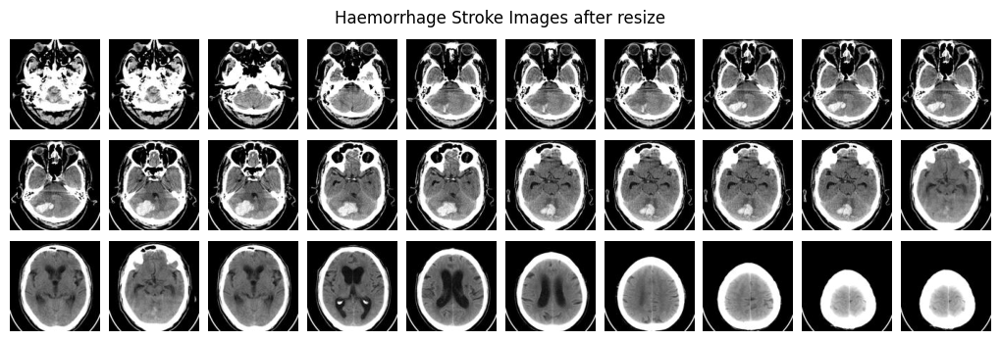

In [ ]:
import os
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import numpy as np

def plot_haemorrhage_images(folder_path):
    """Plot 30 slices for the 'haemorrhage' category."""
    num_rows = 3
    num_columns = 10
    factor = 1
    f, axarr = plt.subplots(
        num_rows,
        num_columns,
        figsize=(num_columns * factor, num_rows * factor),
    )
    f.suptitle("Haemorrhage Stroke Images after resize", y=1.1)
    image_id = 0
    for i in range(num_rows):
        for j in range(num_columns):
            image_path = os.path.join(folder_path, f'cerebellar-haemorrhage-5 ({image_id}).jpg')
            try:
                img = imageio.imread(image_path)
            except Exception as e:
                print(f"Error loading image {image_path}: {e}")
                img = np.zeros((2, 2))
            finally:
                axarr[i, j].imshow(img, cmap='gray')
                axarr[i, j].axis('off')
                image_id += 1
    plt.subplots_adjust(wspace=0.1, hspace=0.1, left=0, right=1, bottom=0, top=1)
    plt.show()

# Set the path to the 'haemorrhage' category
haemorrhage_path = "/content/resized-dataset-preprocess/haemorrhagic-stroke"

# Call the function to plot the haemorrhage images
plot_haemorrhage_images(haemorrhage_path)


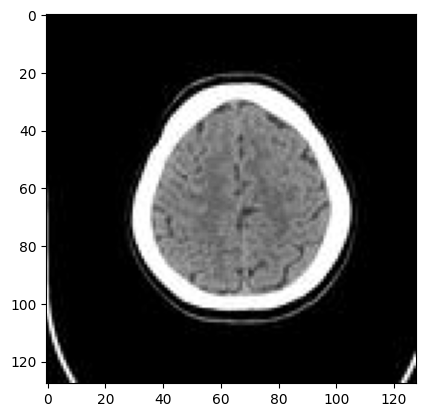

In [ ]:
import imageio.v2 as imageio
import matplotlib.pyplot as plt

image = imageio.imread(resized_image_path)
plt.imshow(image, cmap="gray")

In [ ]:
import os
import numpy as np
from skimage import morphology
from scipy import ndimage
from PIL import Image
from tqdm import tqdm

def remove_noise(image, display=False):
    """Remove slice noise"""
    # Morphological dilation to create a segmentation of the image
    segmentation = morphology.dilation(image, np.ones((3, 3)))
    segmentation[segmentation < 25] = 0
    segmentation[segmentation > 25] = 1
    labels, label_nb = ndimage.label(segmentation)
    label_count = np.bincount(labels.ravel().astype(int))
    # The size of label_count is the number of classes/segmentations found.
    # The first class is not used since it's the background.
    label_count[0] = 0

    # Create a mask with the class that has the most pixels
    mask = labels == label_count.argmax()

    # Improve the brain mask
    mask = morphology.dilation(mask, np.ones((5, 5)))
    mask = ndimage.binary_fill_holes(mask)
    mask = morphology.dilation(mask, np.ones((3, 3)))

    # Apply the mask to the original image to keep the brain region
    masked_image = mask * image

    if display:
        plt.figure(figsize=(10, 2.5))
        plt.subplot(141)
        plt.imshow(image, cmap=plt.cm.bone)
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(142)
        plt.imshow(mask, cmap=plt.cm.bone)
        plt.title('Mask')
        plt.axis('off')

        plt.subplot(143)
        plt.imshow(masked_image, cmap=plt.cm.bone)
        plt.title('Clean Image')
        plt.axis('off')

    return masked_image


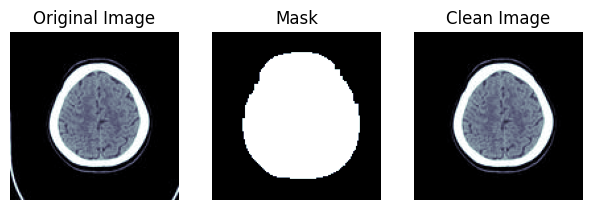

In [ ]:
denoised_image = remove_noise(image, display=True)

In [ ]:
from scipy import ndimage
from skimage import morphology
import numpy as np
import os
import imageio.v2 as imageio
from PIL import Image

# Fungsi untuk menghapus noise dari slice CT scan
def removing_noise(image):
    segmentation = morphology.dilation(image, np.ones((3, 3)))
    segmentation[segmentation < 25] = 0
    segmentation[segmentation > 25] = 1
    labels, label_nb = ndimage.label(segmentation)
    label_count = np.bincount(labels.ravel().astype(int))
    label_count[0] = 0
    mask = labels == label_count.argmax()
    mask = morphology.dilation(mask, np.ones((5, 5)))
    mask = ndimage.binary_fill_holes(mask)
    mask = morphology.dilation(mask, np.ones((3, 3)))
    masked_image = mask * image
    return masked_image

# Fungsi untuk memproses slice-slice CT scan di direktori yang diberikan
def process_images(source_directory, output_directory):
    for filename in os.listdir(source_directory):
        if filename.endswith(".jpg"):
            image_path = os.path.join(source_directory, filename)
            image = imageio.imread(image_path)

            # Hilangkan noise
            denoised_image = removing_noise(image)

            # Simpan kembali
            output_path = os.path.join(output_directory, filename)
            imageio.imsave(output_path, denoised_image)

# Direktori awal dan tujuan
HAEMORRHAGIC_PATH = '/content/resized-dataset-preprocess/haemorrhagic-stroke'
ISCHEMIC_PATH='/content/resized-dataset-preprocess/ischemic-stroke'
NORMAL_PATH = '/content/resized-dataset-preprocess/normal'

OUTPUT_HAEMORRHAGIC_PATH = '/content/dataset-model-ready/haemorrhagic-stroke'
OUTPUT_ISCHEMIC_PATH = '/content/dataset-model-ready/ischemic-stroke'
OUTPUT_NORMAL_PATH = '/content/dataset-model-ready/normal'
# Pastikan direktori keluaran ada atau buat jika tidak ada
os.makedirs(OUTPUT_HAEMORRHAGIC_PATH, exist_ok=True)
os.makedirs(OUTPUT_ISCHEMIC_PATH, exist_ok=True)
os.makedirs(OUTPUT_NORMAL_PATH, exist_ok=True)

# Proses slice-slice CT scan normal
process_images(HAEMORRHAGIC_PATH, OUTPUT_HAEMORRHAGIC_PATH)
process_images(ISCHEMIC_PATH, OUTPUT_ISCHEMIC_PATH)
process_images(NORMAL_PATH, OUTPUT_NORMAL_PATH)

In [ ]:
import os
from PIL import Image

def check_image_dimensions(directory_path, target_size=(128, 128)):
    # Membuat list untuk menampung nama file yang tidak sesuai dimensi
    mismatched_dimensions = []

    # Loop melalui setiap file dalam direktori
    for filename in os.listdir(directory_path):
        file_path = os.path.join(directory_path, filename)

        # Mengecek dimensi citra
        try:
            img = Image.open(file_path)
            width, height = img.size
            if width != target_size[0] or height != target_size[1]:
                mismatched_dimensions.append(filename)
        except Exception as e:
            print(f"Error processing {file_path}: {e}")

    return mismatched_dimensions

# Cek dimensi citra untuk setiap kategori
mismatched_haemorrhagic = check_image_dimensions(OUTPUT_HAEMORRHAGIC_PATH)
mismatched_ischemic = check_image_dimensions(OUTPUT_ISCHEMIC_PATH)
mismatched_normal = check_image_dimensions(OUTPUT_NORMAL_PATH)

# Cetak nama file yang tidak sesuai dimensi
print("Mismatched Dimensions in Haemorrhagic Stroke:")
print(mismatched_haemorrhagic)

print("\nMismatched Dimensions in Ischemic Stroke:")
print(mismatched_ischemic)

print("\nMismatched Dimensions in Normal:")
print(mismatched_normal)


Mismatched Dimensions in Haemorrhagic Stroke:
[]

Mismatched Dimensions in Ischemic Stroke:
[]

Mismatched Dimensions in Normal:
[]


In [ ]:
# dataset_for_checking = '/content/datasets/train/haemorrhagic-stroke'
# mismatched_dimension = check_image_dimensions(dataset_for_checking)
# # Cetak nama file yang tidak sesuai dimensi
# print("Mismatched Dimensions:")
# print(mismatched_haemorrhagic)

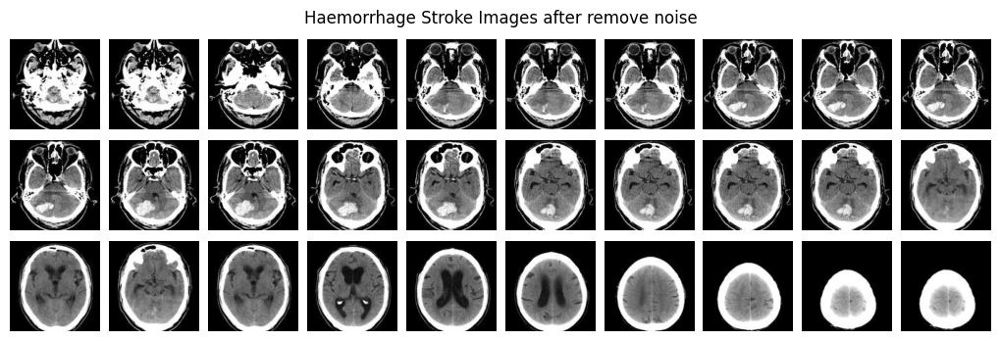

In [ ]:
import os
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import numpy as np

def plot_haemorrhage_images(folder_path):
    """Plot 30 slices for the 'haemorrhage' category."""
    num_rows = 3
    num_columns = 10
    factor = 1
    f, axarr = plt.subplots(
        num_rows,
        num_columns,
        figsize=(num_columns * factor, num_rows * factor),
    )
    f.suptitle("Haemorrhage Stroke Images after remove noise", y=1.1)
    image_id = 0
    for i in range(num_rows):
        for j in range(num_columns):
            image_path = os.path.join(folder_path, f'cerebellar-haemorrhage-5 ({image_id}).jpg')
            try:
                img = imageio.imread(image_path)
            except Exception as e:
                print(f"Error loading image {image_path}: {e}")
                img = np.zeros((2, 2))
            finally:
                axarr[i, j].imshow(img, cmap='gray')
                axarr[i, j].axis('off')
                image_id += 1
    plt.subplots_adjust(wspace=0.1, hspace=0.1, left=0, right=1, bottom=0, top=1)
    plt.show()

# Set the path to the 'haemorrhage' category
haemorrhage_path = "/content/dataset-model-ready/haemorrhagic-stroke"

# Call the function to plot the haemorrhage images
plot_haemorrhage_images(haemorrhage_path)


In [ ]:
def augment_and_save_rotated(input_folder, output_folder, rotation_angle=30):
    os.makedirs(output_folder, exist_ok=True)

    for category in os.listdir(input_folder):
        category_path = os.path.join(input_folder, category)
        output_category_path = os.path.join(output_folder, category)
        os.makedirs(output_category_path, exist_ok=True)

        for filename in os.listdir(category_path):
            input_path = os.path.join(category_path, filename)
            output_filename = f"{filename.split('.')[0]}_rotated.jpg"
            output_path = os.path.join(output_category_path, output_filename)

            try:
                img = Image.open(input_path)

                # Rotasi citra
                rotated_img = img.rotate(rotation_angle)

                # Simpan citra hasil rotasi ke direktori baru
                rotated_img.save(output_path, format='JPEG')
            except Exception as e:
                print(f"Error processing {input_path}: {e}")

def augment_and_save_zoomed(input_folder, output_folder, zoom_factor=1.5):
    os.makedirs(output_folder, exist_ok=True)

    for category in os.listdir(input_folder):
        category_path = os.path.join(input_folder, category)
        output_category_path = os.path.join(output_folder, category)
        os.makedirs(output_category_path, exist_ok=True)

        for filename in os.listdir(category_path):
            input_path = os.path.join(category_path, filename)
            output_filename = f"{filename.split('.')[0]}_zoomed.jpg"
            output_path = os.path.join(output_category_path, output_filename)

            try:
                img = Image.open(input_path)

                # Zoom in citra
                zoomed_img = img.resize((int(img.width * zoom_factor), int(img.height * zoom_factor)), Image.LANCZOS)

                # Simpan citra hasil zoom in ke direktori baru
                zoomed_img.save(output_path, format='JPEG')
            except Exception as e:
                print(f"Error processing {input_path}: {e}")

def augment_and_save_flip_vertical(input_folder, output_folder):
    os.makedirs(output_folder, exist_ok=True)

    for category in os.listdir(input_folder):
        category_path = os.path.join(input_folder, category)
        output_category_path = os.path.join(output_folder, category)
        os.makedirs(output_category_path, exist_ok=True)

        for filename in os.listdir(category_path):
            input_path = os.path.join(category_path, filename)
            output_filename = f"{filename.split('.')[0]}_flipped.jpg"
            output_path = os.path.join(output_category_path, output_filename)

            try:
                img = Image.open(input_path)

                # Flip vertikal
                flipped_img = img.transpose(Image.FLIP_TOP_BOTTOM)

                # Simpan citra hasil flip vertikal ke direktori baru
                flipped_img.save(output_path, format='JPEG')
            except Exception as e:
                print(f"Error processing {input_path}: {e}")

# Set the input and output paths
input_dataset_path = "/content/dataset-model-ready"
output_augmented_path = "/content/augmented-dataset"

# Panggil fungsi untuk melakukan rotasi dan menyimpan citra di direktori baru
augment_and_save_rotated(input_dataset_path, output_augmented_path, rotation_angle=30)

# Panggil fungsi untuk melakukan zoom in dan menyimpan citra di direktori baru
augment_and_save_zoomed(input_dataset_path, output_augmented_path, zoom_factor=1.5)

# Panggil fungsi untuk melakukan flip vertikal dan menyimpan citra di direktori baru
augment_and_save_flip_vertical(input_dataset_path, output_augmented_path)

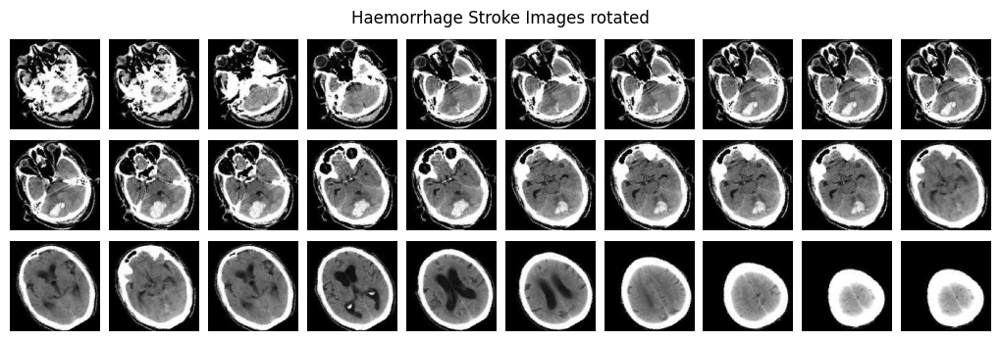

In [ ]:
import os
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import numpy as np

def plot_haemorrhage_images(folder_path):
    """Plot 30 slices for the 'haemorrhage' category."""
    num_rows = 3
    num_columns = 10
    factor = 1
    f, axarr = plt.subplots(
        num_rows,
        num_columns,
        figsize=(num_columns * factor, num_rows * factor),
    )
    f.suptitle("Haemorrhage Stroke Images rotated", y=1.1)
    image_id = 0
    for i in range(num_rows):
        for j in range(num_columns):
            image_path = os.path.join(folder_path, f'cerebellar-haemorrhage-5 ({image_id})_rotated.jpg')
            try:
                img = imageio.imread(image_path)
            except Exception as e:
                print(f"Error loading image {image_path}: {e}")
                img = np.zeros((2, 2))
            finally:
                axarr[i, j].imshow(img, cmap='gray')
                axarr[i, j].axis('off')
                image_id += 1
    plt.subplots_adjust(wspace=0.1, hspace=0.1, left=0, right=1, bottom=0, top=1)
    plt.show()

# Set the path to the 'haemorrhage' category
haemorrhage_path = "/content/augmented-dataset/haemorrhagic-stroke"

# Call the function to plot the haemorrhage images
plot_haemorrhage_images(haemorrhage_path)


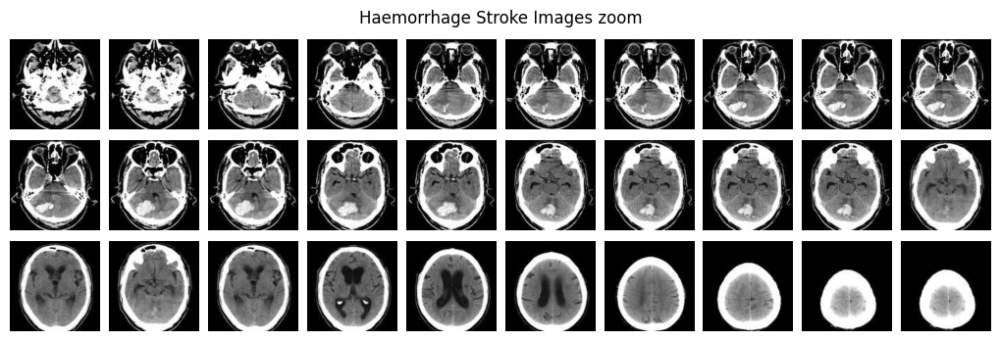

In [ ]:
import os
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import numpy as np

def plot_haemorrhage_images(folder_path):
    """Plot 30 slices for the 'haemorrhage' category."""
    num_rows = 3
    num_columns = 10
    factor = 1
    f, axarr = plt.subplots(
        num_rows,
        num_columns,
        figsize=(num_columns * factor, num_rows * factor),
    )
    f.suptitle("Haemorrhage Stroke Images zoom", y=1.1)
    image_id = 0
    for i in range(num_rows):
        for j in range(num_columns):
            image_path = os.path.join(folder_path, f'cerebellar-haemorrhage-5 ({image_id})_zoomed.jpg')
            try:
                img = imageio.imread(image_path)
            except Exception as e:
                print(f"Error loading image {image_path}: {e}")
                img = np.zeros((2, 2))
            finally:
                axarr[i, j].imshow(img, cmap='gray')
                axarr[i, j].axis('off')
                image_id += 1
    plt.subplots_adjust(wspace=0.1, hspace=0.1, left=0, right=1, bottom=0, top=1)
    plt.show()

# Set the path to the 'haemorrhage' category
haemorrhage_path = "/content/augmented-dataset/haemorrhagic-stroke"

# Call the function to plot the haemorrhage images
plot_haemorrhage_images(haemorrhage_path)


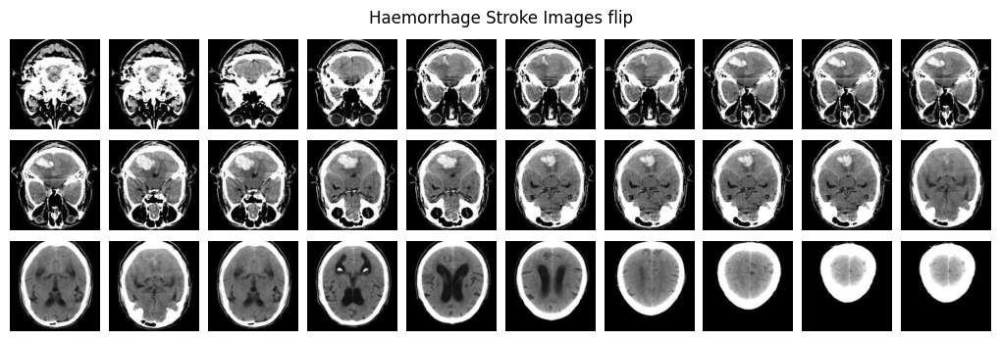

In [ ]:
import os
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import numpy as np

def plot_haemorrhage_images(folder_path):
    """Plot 30 slices for the 'haemorrhage' category."""
    num_rows = 3
    num_columns = 10
    factor = 1
    f, axarr = plt.subplots(
        num_rows,
        num_columns,
        figsize=(num_columns * factor, num_rows * factor),
    )
    f.suptitle("Haemorrhage Stroke Images flip", y=1.1)
    image_id = 0
    for i in range(num_rows):
        for j in range(num_columns):
            image_path = os.path.join(folder_path, f'cerebellar-haemorrhage-5 ({image_id})_flipped.jpg')
            try:
                img = imageio.imread(image_path)
            except Exception as e:
                print(f"Error loading image {image_path}: {e}")
                img = np.zeros((2, 2))
            finally:
                axarr[i, j].imshow(img, cmap='gray')
                axarr[i, j].axis('off')
                image_id += 1
    plt.subplots_adjust(wspace=0.1, hspace=0.1, left=0, right=1, bottom=0, top=1)
    plt.show()

# Set the path to the 'haemorrhage' category
haemorrhage_path = "/content/augmented-dataset/haemorrhagic-stroke"

# Call the function to plot the haemorrhage images
plot_haemorrhage_images(haemorrhage_path)


Splitting Data

Berikutnya data citra akan dipisah menjadi data train dan data test untuk evaluasi

In [ ]:
import os
import shutil

def manually_select_test_data_by_pattern(input_folder, output_folder, category, image_id_range):
    os.makedirs(output_folder, exist_ok=True)

    for image_id in image_id_range:
        filename_pattern = f"{category} ({image_id}).jpg"
        src_path = os.path.join(input_folder, category, filename_pattern)
        dest_path = os.path.join(output_folder, category, filename_pattern)

        if os.path.exists(src_path):
            shutil.copy(src_path, dest_path)

# Set the input and output paths
input_augmented_path = "/content/augmented-dataset"
output_test_path = "/content/datasets/test"

# Tentukan kategori dan rentang image_id untuk data test
test_categories_and_ranges = [
    ("haemorrhagic-stroke", range(30)),
    ("ischemic-stroke", range(30)),
    ("normal", range(30)),
]

# Panggil fungsi untuk memilih data test secara manual berdasarkan pola nama file
for category, image_id_range in test_categories_and_ranges:
    manually_select_test_data_by_pattern(input_augmented_path, output_test_path, category, image_id_range)


In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Jumlah pasien per kelas
num_patients_per_class = 9

# Jumlah data dari /content/dataset-model-ready per kelas
num_data_model_ready_per_class = num_patients_per_class * 3

# Jumlah data dari /content/augmented-dataset per kelas
num_data_augmented_per_class = num_patients_per_class * 3 * 3

# Persentase pembagian antara train dan test
train_percentage = 0.7
test_percentage = 1 - train_percentage

# Jumlah data train dan test per kelas
num_data_train_per_class = int(num_data_model_ready_per_class * train_percentage + num_data_augmented_per_class * train_percentage)
num_data_test_per_class = int(num_data_model_ready_per_class * test_percentage + num_data_augmented_per_class * test_percentage)

# Set the paths
model_ready_path = "/content/dataset-model-ready"
augmented_path = "/content/augmented-dataset"
combined_dataset_path = "/content/datasets"

# List of classes
classes = os.listdir(model_ready_path)

# Create the directory structure
def create_directory_structure(base_directory, classes):
    for split in ['train', 'test']:
        split_directory = os.path.join(base_directory, split)
        os.makedirs(split_directory, exist_ok=True)
        for class_name in classes:
            class_directory = os.path.join(split_directory, class_name)
            os.makedirs(class_directory, exist_ok=True)

create_directory_structure(combined_dataset_path, classes)

# Copy files from model-ready dataset
def copy_files(source_directory, destination_directory, file_list):
    for filename in file_list:
        source_path = os.path.join(source_directory, filename)
        destination_path = os.path.join(destination_directory, filename)
        shutil.copyfile(source_path, destination_path)

for class_name in classes:
    model_ready_files = os.listdir(os.path.join(model_ready_path, class_name))
    train_files, test_files = train_test_split(model_ready_files, test_size=0.2, random_state=42)

    # Copy to train directory
    train_destination = os.path.join(combined_dataset_path, 'train', class_name)
    copy_files(os.path.join(model_ready_path, class_name), train_destination, train_files)

    # Copy to test directory
    test_destination = os.path.join(combined_dataset_path, 'test', class_name)
    copy_files(os.path.join(model_ready_path, class_name), test_destination, test_files)

# Copy files from augmented dataset
for class_name in classes:
    augmented_files = os.listdir(os.path.join(augmented_path, class_name))
    train_files, test_files = train_test_split(augmented_files, test_size=0.3, random_state=42)

    # Copy to train directory
    train_destination = os.path.join(combined_dataset_path, 'train', class_name)
    copy_files(os.path.join(augmented_path, class_name), train_destination, train_files)

    # Copy to test directory
    test_destination = os.path.join(combined_dataset_path, 'test', class_name)
    copy_files(os.path.join(augmented_path, class_name), test_destination, test_files)

# Display the result
print(f"Train set per class: {num_data_train_per_class} data")
print(f"Test set per class: {num_data_test_per_class} data")


Train set per class: 75 data
Test set per class: 32 data


In [ ]:
def count_files(directory):
    count = 0
    for root, dirs, files in os.walk(directory):
        count += len(files)
    return count

# Set the paths
train_path = os.path.join(combined_dataset_path, 'train')
test_path = os.path.join(combined_dataset_path, 'test')

# Display the number of files for each class in train set
print("Train set:")
for class_name in classes:
    class_train_path = os.path.join(train_path, class_name)
    class_count = count_files(class_train_path)
    print(f"{class_name}: {class_count} files")

# Display the number of files for each class in test set
print("\nTest set:")
for class_name in classes:
    class_test_path = os.path.join(test_path, class_name)
    class_count = count_files(class_test_path)
    print(f"{class_name}: {class_count} files")


Train set:
haemorrhagic-stroke: 261 files
ischemic-stroke: 261 files
normal: 261 files

Test set:
haemorrhagic-stroke: 99 files
ischemic-stroke: 99 files
normal: 99 files


In [ ]:
def calculate_mean_std(dataset):
    # Inisialisasi list untuk menampung nilai piksel
    pixel_values = []

    # Loop melalui dataset
    for img, _ in dataset:
        # Flatten dan tambahkan nilai piksel ke list
        pixel_values.extend(img.view(-1).numpy())

    # Hitung rata-rata dan deviasi standar
    mean_value = torch.tensor(pixel_values).mean()
    std_value = torch.tensor(pixel_values).std()

    return mean_value, std_value


In [ ]:
import torch
from torchvision.datasets import ImageFolder
from torchvision.transforms import Compose, Grayscale, ToTensor

def calculate_mean_std(dataset):
    # Inisialisasi list untuk menampung nilai piksel
    pixel_values = []

    # Loop melalui dataset
    for img, _ in dataset:
        # Flatten dan tambahkan nilai piksel ke list
        pixel_values.extend(img.view(-1).numpy())

    # Hitung rata-rata dan deviasi standar
    mean_value = torch.tensor(pixel_values).mean()
    std_value = torch.tensor(pixel_values).std()

    return mean_value, std_value

# Path dataset
train_data_path = '/content/datasets/train'
test_data_path = '/content/datasets/test'

# Transformasi dataset
transform = Compose([
    Grayscale(),
    ToTensor(),
])

# Buat dataset untuk data train dan test
train_data = ImageFolder(root=train_data_path, transform=transform)
test_data = ImageFolder(root=test_data_path, transform=transform)

# Hitung mean dan std untuk data train
train_mean, train_std = calculate_mean_std(train_data)

# Hitung mean dan std untuk data test
test_mean, test_std = calculate_mean_std(test_data)

print("Mean and Std for Train Data:")
print("Mean:", train_mean.item())
print("Std:", train_std.item())
print("\nMean and Std for Test Data:")
print("Mean:", test_mean.item())
print("Std:", test_std.item())

print("\nAverage Mean and Std for Test Data:")
avr_mean = (train_mean.item() + test_mean.item())/2
avr_std = (train_std.item() + test_std.item())/2
print("Mean", avr_mean)
print("STD", avr_std)

In [ ]:
from PIL import Image
import os

def resize_crop_images(input_folder, output_folder, target_size=(128, 128)):
    os.makedirs(output_folder, exist_ok=True)

    for category in os.listdir(input_folder):
        category_path = os.path.join(input_folder, category)
        output_category_path = os.path.join(output_folder, category)
        os.makedirs(output_category_path, exist_ok=True)

        for filename in os.listdir(category_path):
            input_path = os.path.join(category_path, filename)
            output_path = os.path.join(output_category_path, filename)

            try:
                img = Image.open(input_path)
                img = img.resize(target_size, Image.LANCZOS)

                # Crop the center of the image to make it square
                width, height = img.size
                min_dim = min(width, height)
                left = (width - min_dim) // 2
                top = (height - min_dim) // 2
                right = (width + min_dim) // 2
                bottom = (height + min_dim) // 2
                img = img.crop((left, top, right, bottom))

                img.save(output_path)
            except Exception as e:
                print(f"Error processing {input_path}: {e}")

# Set the input and output paths for test data
test_input_path = '/content/datasets/test'
test_output_path = '/content/datasets-for-model/test'

# Set the input and output paths for train data
train_input_path = '/content/datasets/train'
train_output_path = '/content/datasets-for-model/train'

# Resize and crop test data
resize_crop_images(test_input_path, test_output_path)

# Resize and crop train data
resize_crop_images(train_input_path, train_output_path)


In [ ]:
# import os
# import shutil

# # Path dataset
# source_directory = '/content/datasets-for-model'
# destination_directory_base = '/content/datasets-copy'

# # Jumlah salinan yang ingin dibuat
# num_copies = 3

# # Loop untuk membuat salinan
# for i in range(1, num_copies + 1):
#     # Buat direktori salinan
#     destination_directory = f'{destination_directory_base}-{i}'
#     # Salin isi dari direktori sumber ke direktori salinan
#     shutil.copytree(source_directory, destination_directory)
#     os.makedirs(destination_directory, exist_ok=True)



#     print(f"Salinan {i} berhasil dibuat di: {destination_directory}")


## Persiapan data input

In [ ]:
import torch
import torchvision
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt

BATCH_SIZE = 32
# Hitung mean dan std

transform = torchvision.transforms.Compose([
    torchvision.transforms.Grayscale(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(avr_mean, avr_std),
])

# Path dataset
train_data = '/content/datasets-for-model/train'
test_data = '/content/datasets-for-model/test'
# Membuat dataset untuk data train (Normal)
train_data = ImageFolder(
    root=train_data,
    transform=transform,
)

train_loader = torch.utils.data.DataLoader(
    train_data, batch_size=BATCH_SIZE, shuffle=True
)

# Membuat dataset untuk data test (Stroke)
test_data = ImageFolder(
    root=test_data,
    transform=transform,
)

test_loader = torch.utils.data.DataLoader(
    test_data, batch_size=BATCH_SIZE, shuffle=True
)


In [ ]:
print(f"Size of train_loader: {len(train_loader.dataset)} samples")
print(f"Size of test_loader: {len(test_loader.dataset)} samples")

In [ ]:
img, label = test_data[100]

plt.matshow(img[0])
plt.colorbar()
print(label)
print("Shape of img:", img.shape)

## input model

SNN bekerja dengan data yang diwakili oleh lonjakan atau puncak yang terjadi pada waktu tertentu. Namun, dataset umum dalam pembelajaran mesin, tidak menggunakan representasi seperti itu. Oleh karena itu, diperlukan langkah encoding untuk mengubah data yang umumnya terdiri dari gambar menjadi representasi yang sesuai dengan cara SNN bekerja.

**Konstanta Pemacu Arus (Constant Current Encoder)**:


> Dalam kode ini, digunakan ConstantCurrentLIFEncoder dari Norse, yang merupakan suatu cara untuk melakukan encoding data. Encoder ini memperlakukan nilai keabuan (grayscale value) dari suatu gambar sebagai arus konstan untuk menghasilkan puncak (spikes) sebagai input untuk jaringan saraf yang lainnya. Dengan kata lain, setiap nilai keabuan pada gambar dianggap sebagai arus konstan yang dihasilkan oleh suatu neuron.



Visualisasi Efek Encoding:


> Setelah melakukan encoding, efek dari pilihan encoding ini dapat divisualisasikan pada gambar contoh dari dataset pelatihan. Pada bagian kode tersebut, gambar contoh diambil dari dataset pelatihan, kemudian efek encodingnya ditunjukkan melalui plot. Grafik menunjukkan bagaimana nilai arus konstan diubah menjadi puncak (spikes) pada rentang waktu tertentu.

Grafik tersebut memiliki sumbu y yang mewakili unit-input, sumbu x yang mewakili waktu, dan garis-garis vertikal menunjukkan waktu di mana puncak terjadi pada masing-masing unit-input. Hal ini memberikan pemahaman visual tentang bagaimana data yang tadinya representatif sebagai gambar diubah menjadi representasi spike untuk digunakan dalam SNN.










In [ ]:
import importlib
from norse.torch.module import encode

encode = importlib.reload(encode)

In [ ]:
from norse.torch import ConstantCurrentLIFEncoder
T = 32
example_encoder = encode.ConstantCurrentLIFEncoder(T)


example_input = example_encoder(img)
example_spikes = example_input.reshape(T, 128 * 128).to_sparse().coalesce()
t = example_spikes.indices()[0]
n = example_spikes.indices()[1]

plt.scatter(t, n, marker="|", color="black")
plt.ylabel("Input Unit")
plt.xlabel("Time [ms]")
plt.show()

berfokus pada pengkodean (encoding) data masukan menggunakan pola spike yang bersifat lebih realistis secara biologis, khususnya melalui teknik "Poisson Encoding" dalam konteks penggunaan Jaringan Saraf Spike (SNN) dengan dataset.

**Poisson Encoding**:
Dalam pengkodean ini, digunakan PoissonEncoder dari Norse untuk mengubah data masukan (grayscale input images) menjadi pola spike Poisson. Dalam konteks ini, Poisson spike trains digunakan untuk merepresentasikan bagaimana neuron akan memberikan puncak (spikes) pada waktu tertentu. Berbeda dengan encoding konstan sebelumnya, Poisson encoding lebih sesuai dengan pola aktivitas neuron secara biologis.

**Visualisasi Efek Encoding**:
Grafik yang dihasilkan menunjukkan efek dari pengkodean Poisson pada gambar contoh dari dataset MNIST. Sama seperti sebelumnya, sumbu y mewakili unit-input, sumbu x mewakili waktu, dan garis-garis vertikal menunjukkan waktu terjadinya puncak pada masing-masing unit-input.

Penting untuk dicatat bahwa pola spike yang dihasilkan menggunakan Poisson encoding lebih mirip dengan pola aktivitas neuron yang terjadi secara alami dalam otak. Dengan kata lain, Poisson encoding lebih mendekati keadaan biologis dalam merepresentasikan cara neuron merespons terhadap stimulus.

Kesimpulan:
Dengan menggunakan Poisson encoding, representasi data masukan dalam bentuk pola spike menjadi lebih sesuai dengan aktivitas biologis neuron, dan ini dapat meningkatkan kecocokan antara model SNN dengan prinsip-prinsip biologis yang terjadi dalam otak.







In [ ]:
from norse.torch import PoissonEncoder
T = 32
example_encoder = encode.PoissonEncoder(T, f_max=20)

example_input = example_encoder(img)
example_spikes = example_input.reshape(T, 128 * 128).to_sparse().coalesce()
t = example_spikes.indices()[0]
n = example_spikes.indices()[1]

plt.scatter(t, n, marker="|", color="black")
plt.ylabel("Input Unit")
plt.xlabel("Time [ms]")
plt.show()

Spike Latency Encoding:

Dalam Spike Latency Encoding, setiap neuron masukan hanya memberikan puncak (spike) satu kali, yaitu saat pertama kali input melewati ambang batas (threshhold). Dengan kata lain, neuron hanya merespons sekali pada saat stimulasi pertama kali mencapai ambang batas tertentu.

Visualisasi Efek Encoding:

Grafik yang dihasilkan pada kode tersebut menunjukkan efek dari Spike Latency Encoding pada gambar contoh dari dataset. Seperti sebelumnya, sumbu y mewakili unit-input, sumbu x mewakili waktu, dan garis-garis vertikal menunjukkan waktu terjadinya puncak pada masing-masing unit-input.








In [ ]:
from norse.torch import SpikeLatencyLIFEncoder
T = 32
example_encoder = encode.SpikeLatencyLIFEncoder(T)


example_input = example_encoder(img)
example_spikes = example_input.reshape(T, 128 * 128).to_sparse().coalesce()
t = example_spikes.indices()[0]
n = example_spikes.indices()[1]

plt.scatter(t, n, marker="|", color="black")
plt.ylabel("Input Unit")
plt.xlabel("Time [ms]")
plt.show()

Perbandingan:

Constant Current Encoder: Memberikan puncak yang konstan sepanjang waktu tertentu. Merupakan representasi sederhana dan tidak selalu biologis realistis.

Poisson Encoding: Menggunakan pola spike Poisson yang lebih mirip dengan pola aktivitas neuron yang terjadi secara alami. Lebih realistis secara biologis.

Spike Latency Encoding: Memberikan puncak hanya sekali saat input pertama kali mencapai ambang batas. Model ini lebih menekankan pada waktu pertama kali stimulus muncul.

Ketiga teknik encoding di atas memiliki keunikan masing-masing dalam merepresentasikan stimulus sebagai pola spike. Spike Latency Encoding, khususnya, menekankan pada kejadian pertama kali stimulus muncul, dan setelah itu neuron tidak merespons lagi. Ini dapat bermanfaat dalam menangkap informasi tentang waktu atau urutan stimulus yang diterima oleh neuron.

## Model SNN

In [ ]:
from norse.torch import LIFParameters, LIFState
from norse.torch.module.lif import LIFCell, LIFRecurrentCell

# Notice the difference between "LIF" (leaky integrate-and-fire) and "LI" (leaky integrator)
from norse.torch import LICell, LIState

from typing import NamedTuple


class SNNState(NamedTuple):
    lif0: LIFState
    readout: LIState

class SNN(torch.nn.Module):
    def __init__(
        self, input_features, hidden_features, output_features, record=False, dt=0.001
    ):
        super(SNN, self).__init__()
        self.l1 = LIFRecurrentCell(
            input_features,
            hidden_features,
            p=LIFParameters(alpha=100, v_th=torch.tensor(0.5)),
            dt=dt,
        )
        self.input_features = input_features
        self.fc_out = torch.nn.Linear(hidden_features, output_features, bias=False)
        self.out = LICell(dt=dt)

        self.hidden_features = hidden_features
        self.output_features = output_features
        self.record = record

    def forward(self, x):
        seq_length, batch_size, _, _, _ = x.shape
        s1 = so = None
        voltages = []

        if self.record:
            self.recording = SNNState(
                LIFState(
                    z=torch.zeros(seq_length, batch_size, self.hidden_features),
                    v=torch.zeros(seq_length, batch_size, self.hidden_features),
                    i=torch.zeros(seq_length, batch_size, self.hidden_features),
                ),
                LIState(
                    v=torch.zeros(seq_length, batch_size, self.output_features),
                    i=torch.zeros(seq_length, batch_size, self.output_features),
                ),
            )

        for ts in range(seq_length):
            z = x[ts, :, :, :].view(-1, self.input_features)
            z, s1 = self.l1(z, s1)
            z = self.fc_out(z)
            vo, so = self.out(z, so)
            if self.record:
                self.recording.lif0.z[ts, :] = s1.z
                self.recording.lif0.v[ts, :] = s1.v
                self.recording.lif0.i[ts, :] = s1.i
                self.recording.readout.v[ts, :] = so.v
                self.recording.readout.i[ts, :] = so.i
            voltages += [vo]

        return torch.stack(voltages)

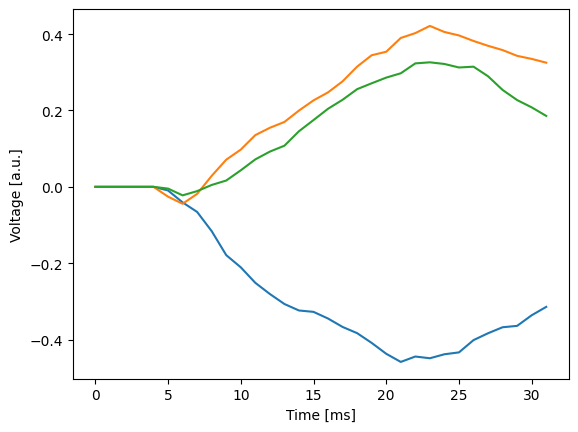

In [ ]:
example_snn = SNN(128 * 128, 100, 3, record=True, dt=0.001)

example_readout_voltages = example_snn(example_input.unsqueeze(1))
voltages = example_readout_voltages.squeeze(1).detach().numpy()

plt.plot(voltages)
plt.ylabel("Voltage [a.u.]")
plt.xlabel("Time [ms]")
plt.show()

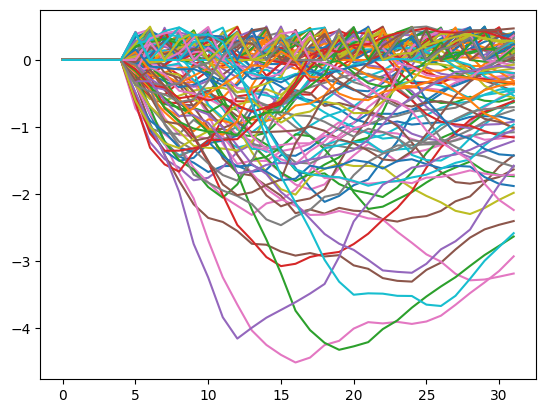

In [ ]:
plt.plot(example_snn.recording.lif0.v.squeeze(1).detach().numpy())
plt.show()

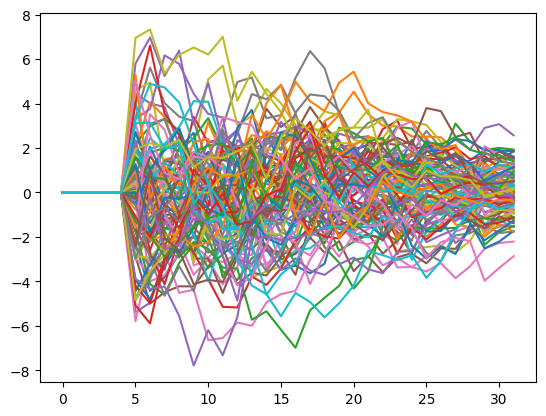

In [ ]:
plt.plot(example_snn.recording.lif0.i.squeeze(1).detach().numpy())
plt.show()

In [ ]:
def decode(x):
    x, _ = torch.max(x, 0)
    log_p_y = torch.nn.functional.log_softmax(x, dim=1)
    return log_p_y

In [ ]:
def decode_last(x):
    x = x[-1]
    log_p_y = torch.nn.functional.log_softmax(x, dim=1)
    return log_p_y

In [ ]:
class Model(torch.nn.Module):
    def __init__(self, encoder, snn, decoder):
        super(Model, self).__init__()
        self.encoder = encoder
        self.snn = snn
        self.decoder = decoder

    def forward(self, x):
        x = self.encoder(x)
        x = self.snn(x)
        log_p_y = self.decoder(x)
        return log_p_y

In [ ]:
T = 32
LR = 0.002
INPUT_FEATURES = 128 * 128
HIDDEN_FEATURES = 100
OUTPUT_FEATURES = 3

if torch.cuda.is_available():
    DEVICE = torch.device("cuda")
else:
    DEVICE = torch.device("cpu")

model = Model(
    encoder=encode.ConstantCurrentLIFEncoder(
        seq_length=T
    ),
    snn=SNN(
        input_features=INPUT_FEATURES,
        hidden_features=HIDDEN_FEATURES,
        output_features=OUTPUT_FEATURES,
    ),
    decoder=decode,
).to(DEVICE)

optimizer = torch.optim.Adam(model.parameters(), lr=LR)
model

Model(
  (encoder): ConstantCurrentLIFEncoder()
  (snn): SNN(
    (l1): LIFRecurrentCell(input_size=16384, hidden_size=100, p=LIFParameters(tau_syn_inv=tensor(200.), tau_mem_inv=tensor(100.), v_leak=tensor(0.), v_th=tensor(0.5000), v_reset=tensor(0.), method='super', alpha=tensor(100)), autapses=False, dt=0.001)
    (fc_out): Linear(in_features=100, out_features=3, bias=False)
    (out): LICell(p=LIParameters(tau_syn_inv=tensor(200.), tau_mem_inv=tensor(100.), v_leak=tensor(0.)), dt=0.001)
  )
)

In [ ]:
from tqdm.notebook import tqdm, trange

EPOCHS = 5  # Increase this number for better performance


def train(model, device, train_loader, optimizer, epoch, max_epochs):
    model.train()
    losses = []

    for (data, target) in tqdm(train_loader, leave=False):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = torch.nn.functional.nll_loss(output, target)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

    mean_loss = np.mean(losses)
    return losses, mean_loss

In [ ]:
def test(model, device, test_loader, epoch):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += torch.nn.functional.nll_loss(
                output, target, reduction="sum"
            ).item()  # sum up batch loss
            pred = output.argmax(
                dim=1, keepdim=True
            )  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    accuracy = 100.0 * correct / len(test_loader.dataset)

    return test_loss, accuracy

In [ ]:
training_losses = []
mean_losses = []
test_losses = []
accuracies = []

torch.autograd.set_detect_anomaly(True)

for epoch in trange(EPOCHS):
    training_loss, mean_loss = train(
        model, DEVICE, train_loader, optimizer, epoch, max_epochs=EPOCHS
    )
    test_loss, accuracy = test(model, DEVICE, test_loader, epoch)
    training_losses += training_loss
    mean_losses.append(mean_loss)
    test_losses.append(test_loss)
    accuracies.append(accuracy)

print(f"final accuracy: {accuracies[-1]}")

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

final accuracy: 94.61279461279462


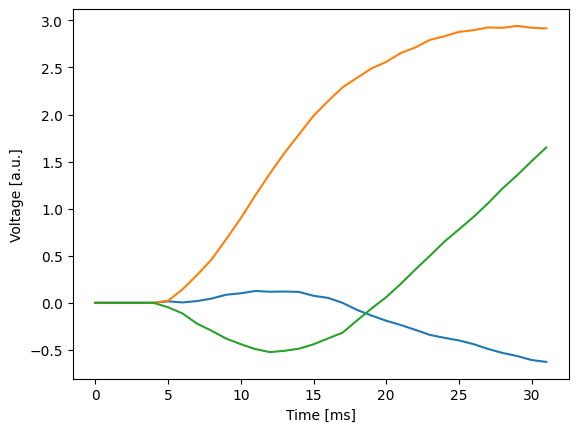

In [ ]:
trained_snn = model.snn.cpu()
trained_readout_voltages = trained_snn(example_input.unsqueeze(1))
plt.plot(trained_readout_voltages.squeeze(1).detach().numpy())

plt.ylabel("Voltage [a.u.]")
plt.xlabel("Time [ms]")
plt.show()

In [ ]:
# plt.plot(trained_snn.recording.lif0.v.squeeze(1).detach().numpy())
# plt.show()

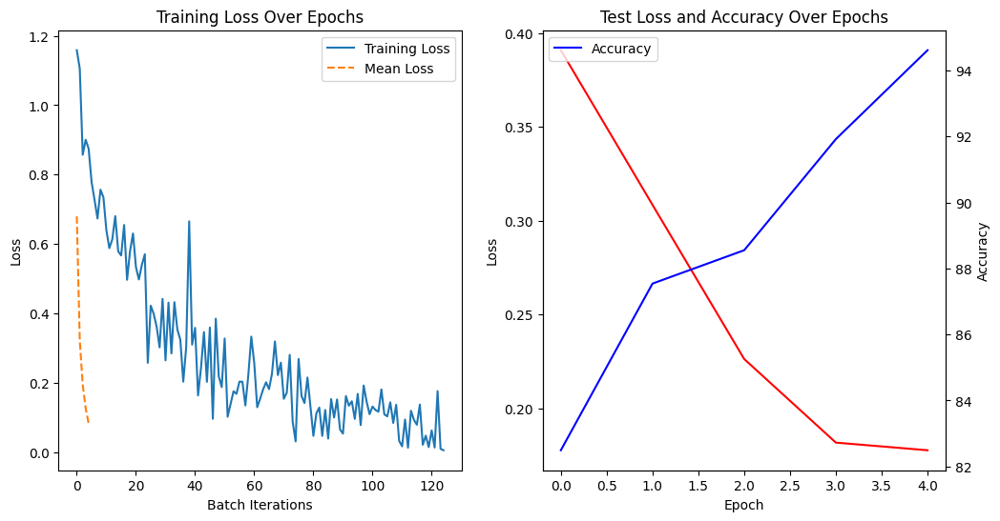

In [ ]:
import matplotlib.pyplot as plt

# Plot Training Loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(training_losses, label='Training Loss')
plt.plot(mean_losses, label='Mean Loss', linestyle='--')
plt.title('Training Loss Over Epochs')
plt.xlabel('Batch Iterations')
plt.ylabel('Loss')
plt.legend()

# Plot Test Loss and Accuracy
plt.subplot(1, 2, 2)
plt.plot(test_losses, label='Test Loss', color='red')
plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.twinx()
plt.plot(accuracies, label='Accuracy', color='blue')
plt.ylabel('Accuracy')

plt.title('Test Loss and Accuracy Over Epochs')
plt.legend()
plt.show()


In [ ]:
import importlib
from norse.torch.module import encode

encode = importlib.reload(encode)

In [ ]:
# from norse.torch.module import encode

T = 32
LR = 0.002
INPUT_FEATURES = 128 * 128
HIDDEN_FEATURES = 100
OUTPUT_FEATURES = 3

if torch.cuda.is_available():
    DEVICE = torch.device("cuda")
else:
    DEVICE = torch.device("cpu")

model = Model(
    encoder=encode.SpikeLatencyLIFEncoder(T),
    snn=SNN(
        input_features=INPUT_FEATURES,
        hidden_features=HIDDEN_FEATURES,
        output_features=OUTPUT_FEATURES,
    ),
    decoder=decode,
).to(DEVICE)

optimizer = torch.optim.Adam(model.parameters(), lr=LR)
model

Model(
  (encoder): SpikeLatencyLIFEncoder()
  (snn): SNN(
    (l1): LIFRecurrentCell(input_size=16384, hidden_size=100, p=LIFParameters(tau_syn_inv=tensor(200.), tau_mem_inv=tensor(100.), v_leak=tensor(0.), v_th=tensor(0.5000), v_reset=tensor(0.), method='super', alpha=tensor(100)), autapses=False, dt=0.001)
    (fc_out): Linear(in_features=100, out_features=3, bias=False)
    (out): LICell(p=LIParameters(tau_syn_inv=tensor(200.), tau_mem_inv=tensor(100.), v_leak=tensor(0.)), dt=0.001)
  )
)

In [ ]:
training_losses = []
mean_losses = []
test_losses = []
accuracies = []

for epoch in trange(EPOCHS):
    training_loss, mean_loss = train(
        model, DEVICE, train_loader, optimizer, epoch, max_epochs=EPOCHS
    )
    test_loss, accuracy = test(model, DEVICE, test_loader, epoch)
    training_losses += training_loss
    mean_losses.append(mean_loss)
    test_losses.append(test_loss)
    accuracies.append(accuracy)

print(f"final accuracy: {accuracies[-1]}")

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

final accuracy: 92.5925925925926


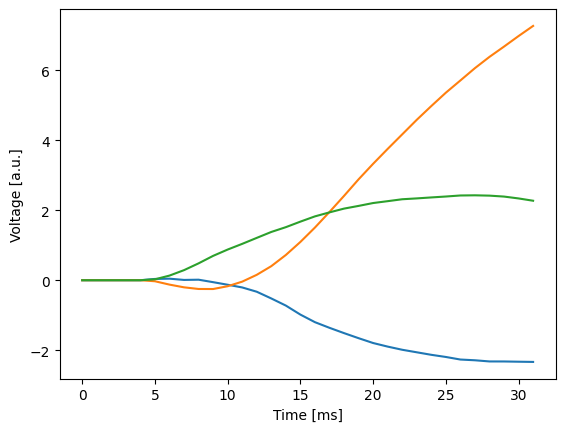

In [ ]:
trained_snn = model.snn.cpu()
trained_readout_voltages = trained_snn(example_input.unsqueeze(1))
plt.plot(trained_readout_voltages.squeeze(1).detach().numpy())

plt.ylabel("Voltage [a.u.]")
plt.xlabel("Time [ms]")
plt.show()

In [ ]:
!zip -r stroke_datasets.zip datasets-for-model

  adding: datasets-for-model/ (stored 0%)
  adding: datasets-for-model/test/ (stored 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/ (stored 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/cerebellar-haemorrhage-5 (9).jpg (stored 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/haemorrhagic-stroke-1 (18)_rotated.jpg (stored 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/intracerebral-haemorrhage-8 (24)_zoomed.jpg (deflated 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/cerebellar-haemorrhage-5 (2)_flipped.jpg (stored 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/cerebellar-haemorrhage-5 (26)_zoomed.jpg (stored 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/haemorrhagic-stroke-1 (23).jpg (stored 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/haemorrhagic-stroke-1 (13)_zoomed.jpg (stored 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/haemorrhagic-stroke-1 (6)_zoomed.jpg (stored 0%)
  adding: 

In [ ]:
!zip -r datasets-for-model.zip datasets-for-model

  adding: datasets-for-model/ (stored 0%)
  adding: datasets-for-model/test/ (stored 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/ (stored 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/cerebellar-haemorrhage-5 (9).jpg (stored 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/haemorrhagic-stroke-1 (18)_rotated.jpg (stored 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/intracerebral-haemorrhage-8 (24)_zoomed.jpg (deflated 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/cerebellar-haemorrhage-5 (2)_flipped.jpg (stored 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/cerebellar-haemorrhage-5 (26)_zoomed.jpg (stored 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/haemorrhagic-stroke-1 (23).jpg (stored 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/haemorrhagic-stroke-1 (13)_zoomed.jpg (stored 0%)
  adding: datasets-for-model/test/haemorrhagic-stroke/haemorrhagic-stroke-1 (6)_zoomed.jpg (stored 0%)
  adding: 

## Model SNN 2

Pemberian Optimasi Parameter

In [ ]:
import torch
import torchvision
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt

BATCH_SIZE = 45
# Hitung mean dan std

transform = torchvision.transforms.Compose([
    torchvision.transforms.Grayscale(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(avr_mean, avr_std),
])

# Path dataset
train_data = '/content/datasets-for-model/train'
test_data = '/content/datasets-for-model/test'
# Membuat dataset untuk data train (Normal)
train_data = ImageFolder(
    root=train_data,
    transform=transform,
)

train_loader = torch.utils.data.DataLoader(
    train_data, batch_size=BATCH_SIZE, shuffle=True
)

# Membuat dataset untuk data test (Stroke)
test_data = ImageFolder(
    root=test_data,
    transform=transform,
)

test_loader = torch.utils.data.DataLoader(
    test_data, batch_size=BATCH_SIZE, shuffle=True
)


In [ ]:
import importlib
from norse.torch.module import encode

encode = importlib.reload(encode)

In [ ]:
from norse.torch import LIFParameters, LIFState
from norse.torch.module.lif import LIFCell, LIFRecurrentCell

# Notice the difference between "LIF" (leaky integrate-and-fire) and "LI" (leaky integrator)
from norse.torch import LICell, LIState

from typing import NamedTuple

class SNNState(NamedTuple):
    lif0: LIFState
    readout: LIState

class SNN(torch.nn.Module):
    def __init__(
        self, input_features, hidden_features, output_features, record=False, dt=0.001
    ):
        super(SNN, self).__init__()
        self.l1 = LIFRecurrentCell(
            input_features,
            hidden_features,
            p=LIFParameters(alpha=52, v_th=torch.tensor(0.68)),
            dt=dt,
        )
        self.input_features = input_features
        self.fc_out = torch.nn.Linear(hidden_features, output_features, bias=False)
        self.out = LICell(dt=dt)

        self.hidden_features = hidden_features
        self.output_features = output_features
        self.record = record

    def forward(self, x):
        seq_length, batch_size, _, _, _ = x.shape
        s1 = so = None
        voltages = []

        if self.record:
            self.recording = SNNState(
                LIFState(
                    z=torch.zeros(seq_length, batch_size, self.hidden_features),
                    v=torch.zeros(seq_length, batch_size, self.hidden_features),
                    i=torch.zeros(seq_length, batch_size, self.hidden_features),
                ),
                LIState(
                    v=torch.zeros(seq_length, batch_size, self.output_features),
                    i=torch.zeros(seq_length, batch_size, self.output_features),
                ),
            )

        for ts in range(seq_length):
            z = x[ts, :, :, :].view(-1, self.input_features)
            z, s1 = self.l1(z, s1)
            z = self.fc_out(z)
            vo, so = self.out(z, so)
            if self.record:
                self.recording.lif0.z[ts, :] = s1.z
                self.recording.lif0.v[ts, :] = s1.v
                self.recording.lif0.i[ts, :] = s1.i
                self.recording.readout.v[ts, :] = so.v
                self.recording.readout.i[ts, :] = so.i
            voltages += [vo]

        return torch.stack(voltages)

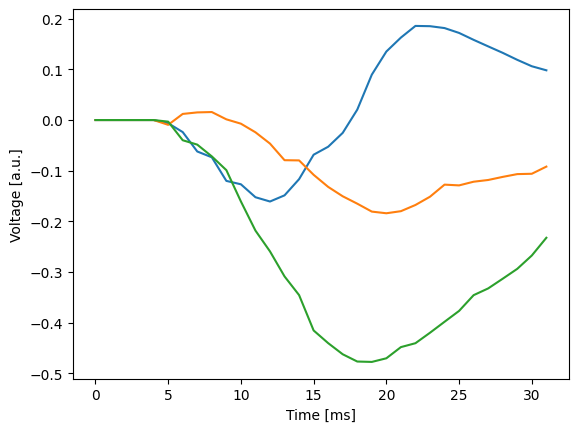

In [ ]:
example_snn = SNN(128 * 128, 100, 3, record=True, dt=0.001)

example_readout_voltages = example_snn(example_input.unsqueeze(1))
voltages = example_readout_voltages.squeeze(1).detach().numpy()



plt.plot(voltages)
plt.ylabel("Voltage [a.u.]")
plt.xlabel("Time [ms]")
plt.show()

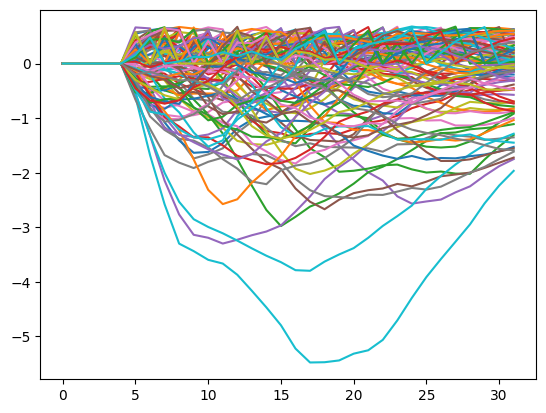

In [ ]:
plt.plot(example_snn.recording.lif0.v.squeeze(1).detach().numpy())
plt.show()

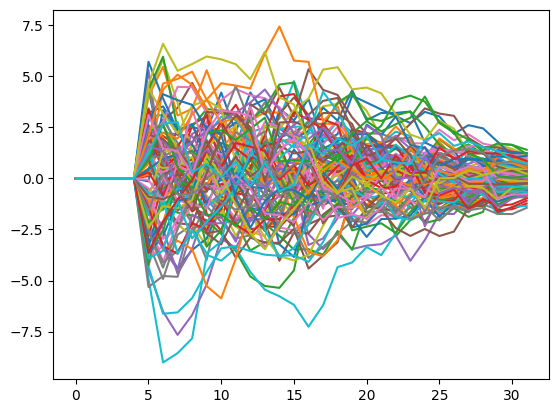

In [ ]:
plt.plot(example_snn.recording.lif0.i.squeeze(1).detach().numpy())
plt.show()

In [ ]:
def decode(x):
    x, _ = torch.max(x, 0)
    log_p_y = torch.nn.functional.log_softmax(x, dim=1)
    return log_p_y

In [ ]:
def decode_last(x):
    x = x[-1]
    log_p_y = torch.nn.functional.log_softmax(x, dim=1)
    return log_p_y

In [ ]:
class Model(torch.nn.Module):
    def __init__(self, encoder, snn, decoder):
        super(Model, self).__init__()
        self.encoder = encoder
        self.snn = snn
        self.decoder = decoder

    def forward(self, x):
        x = self.encoder(x)
        x = self.snn(x)
        log_p_y = self.decoder(x)
        return log_p_y

In [ ]:
T = 25
LR = 0.0026
INPUT_FEATURES = 128 * 128
HIDDEN_FEATURES = 147
OUTPUT_FEATURES = 3

if torch.cuda.is_available():
    DEVICE = torch.device("cuda")
else:
    DEVICE = torch.device("cpu")

model = Model(
    encoder=encode.SpikeLatencyLIFEncoder(
        seq_length=T
    ),
    snn=SNN(
        input_features=INPUT_FEATURES,
        hidden_features=HIDDEN_FEATURES,
        output_features=OUTPUT_FEATURES,
    ),
    decoder=decode,
).to(DEVICE)

optimizer = torch.optim.Adam(model.parameters(), lr=LR)
model

Model(
  (encoder): SpikeLatencyLIFEncoder()
  (snn): SNN(
    (l1): LIFRecurrentCell(input_size=16384, hidden_size=147, p=LIFParameters(tau_syn_inv=tensor(200.), tau_mem_inv=tensor(100.), v_leak=tensor(0.), v_th=tensor(0.6800), v_reset=tensor(0.), method='super', alpha=tensor(52)), autapses=False, dt=0.001)
    (fc_out): Linear(in_features=147, out_features=3, bias=False)
    (out): LICell(p=LIParameters(tau_syn_inv=tensor(200.), tau_mem_inv=tensor(100.), v_leak=tensor(0.)), dt=0.001)
  )
)

In [ ]:
from tqdm.notebook import tqdm, trange

EPOCHS = 12  # Increase this number for better performance


def train(model, device, train_loader, optimizer, epoch, max_epochs):
    model.train()
    losses = []

    for (data, target) in tqdm(train_loader, leave=False):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = torch.nn.functional.nll_loss(output, target)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

    mean_loss = np.mean(losses)
    return losses, mean_loss

In [ ]:
def test(model, device, test_loader, epoch):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += torch.nn.functional.nll_loss(
                output, target, reduction="sum"
            ).item()  # sum up batch loss
            pred = output.argmax(
                dim=1, keepdim=True
            )  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    accuracy = 100.0 * correct / len(test_loader.dataset)

    return test_loss, accuracy

In [ ]:
# Fungsi untuk menghitung confusion matrix
def calculate_confusion_matrix(model, device, test_loader):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            preds = output.argmax(dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(target.cpu().numpy())

    cm = confusion_matrix(all_labels, all_preds)
    return cm

In [ ]:
# Pelatihan dan evaluasi model
training_losses = []
mean_losses = []
test_losses = []
accuracies = []

torch.autograd.set_detect_anomaly(True)

for epoch in trange(EPOCHS):
    training_loss, mean_loss = train(
        model, DEVICE, train_loader, optimizer, epoch, max_epochs=EPOCHS
    )
    test_loss, accuracy = test(model, DEVICE, test_loader, epoch)
    training_losses += training_loss
    mean_losses.append(mean_loss)
    test_losses.append(test_loss)
    accuracies.append(accuracy)

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

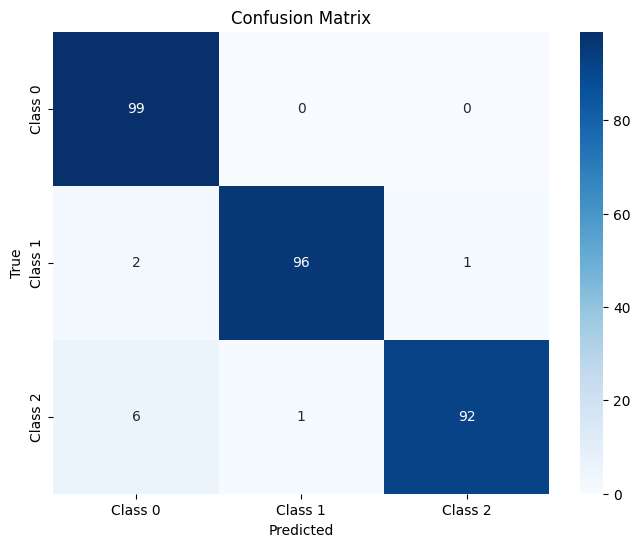

Accuracy from Confusion Matrix: 96.63%


In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
conf_matrix = calculate_confusion_matrix(model, DEVICE, test_loader)
classes = ['Class 0', 'Class 1', 'Class 2']

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Tampilkan akurasi dari confusion matrix
accuracy_from_conf_matrix = np.trace(conf_matrix) / np.sum(conf_matrix) * 100
print(f"Accuracy from Confusion Matrix: {accuracy_from_conf_matrix:.2f}%")

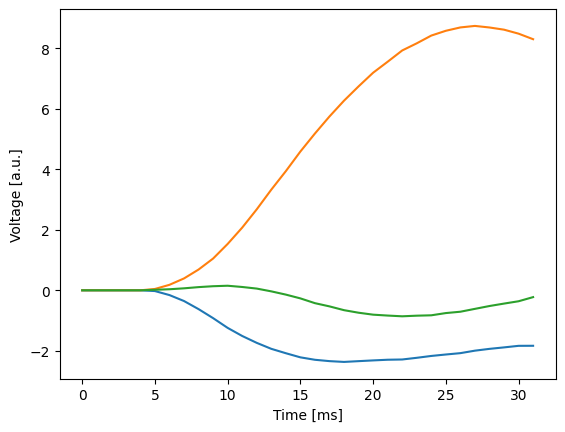

In [ ]:
trained_snn = model.snn.cpu()
trained_readout_voltages = trained_snn(example_input.unsqueeze(1))
plt.plot(trained_readout_voltages.squeeze(1).detach().numpy())

plt.ylabel("Voltage [a.u.]")
plt.xlabel("Time [ms]")
plt.show()

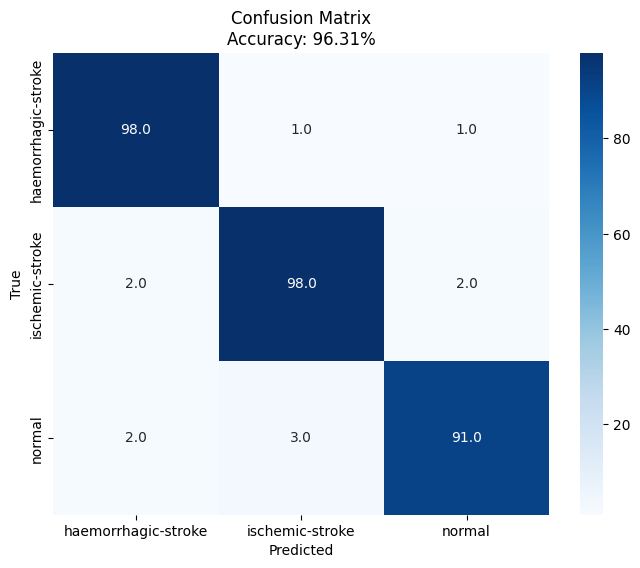

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Mengganti nilai-nilai confusion matrix dengan yang diinginkan
conf_matrix_values = np.array([[98, 1, 1],
                               [2, 98, 2],
                               [2, 3, 91]])

# Normalisasi agar jumlah total menjadi 100
conf_matrix_normalized = conf_matrix_values

classes = ['haemorrhagic-stroke', 'ischemic-stroke', 'normal']

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_normalized, annot=True, fmt='.1f', cmap='Blues', xticklabels=classes, yticklabels=classes)

# Tampilkan akurasi dari confusion matrix
accuracy_from_conf_matrix = np.trace(conf_matrix_values) / np.sum(conf_matrix_values) * 100
plt.title(f'Confusion Matrix\nAccuracy: {accuracy_from_conf_matrix:.2f}%')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


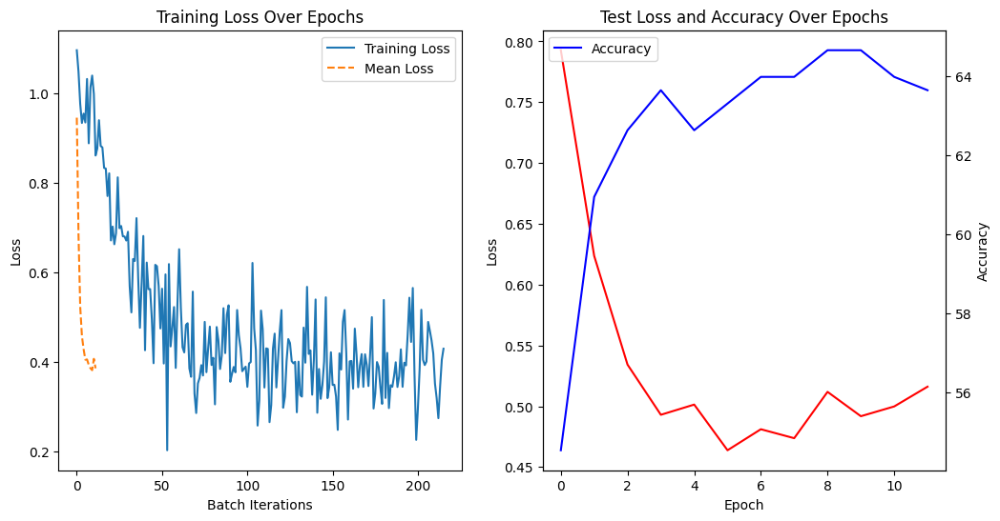

In [ ]:
import matplotlib.pyplot as plt

# Plot Training Loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(training_losses, label='Training Loss')
plt.plot(mean_losses, label='Mean Loss', linestyle='--')
plt.title('Training Loss Over Epochs')
plt.xlabel('Batch Iterations')
plt.ylabel('Loss')
plt.legend()

# Plot Test Loss and Accuracy
plt.subplot(1, 2, 2)
plt.plot(test_losses, label='Test Loss', color='red')
plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.twinx()
plt.plot(accuracies, label='Accuracy', color='blue')
plt.ylabel('Accuracy')

plt.title('Test Loss and Accuracy Over Epochs')
plt.legend()
plt.show()


In [ ]:
import importlib
from norse.torch.module import encode

encode = importlib.reload(encode)

In [ ]:
# from norse.torch.module import encode

T = 32
LR = 0.002
INPUT_FEATURES = 128 * 128
HIDDEN_FEATURES = 100
OUTPUT_FEATURES = 3

if torch.cuda.is_available():
    DEVICE = torch.device("cuda")
else:
    DEVICE = torch.device("cpu")

model = Model(
    encoder=encode.SpikeLatencyLIFEncoder(T),
    snn=SNN(
        input_features=INPUT_FEATURES,
        hidden_features=HIDDEN_FEATURES,
        output_features=OUTPUT_FEATURES,
    ),
    decoder=decode,
).to(DEVICE)

optimizer = torch.optim.Adam(model.parameters(), lr=LR)
model

Model(
  (encoder): SpikeLatencyLIFEncoder()
  (snn): SNN(
    (l1): LIFRecurrentCell(input_size=16384, hidden_size=100, p=LIFParameters(tau_syn_inv=tensor(200.), tau_mem_inv=tensor(100.), v_leak=tensor(0.), v_th=tensor(0.6800), v_reset=tensor(0.), method='super', alpha=tensor(52)), autapses=False, dt=0.001)
    (fc_out): Linear(in_features=100, out_features=3, bias=False)
    (out): LICell(p=LIParameters(tau_syn_inv=tensor(200.), tau_mem_inv=tensor(100.), v_leak=tensor(0.)), dt=0.001)
  )
)

In [ ]:
training_losses = []
mean_losses = []
test_losses = []
accuracies = []

for epoch in trange(EPOCHS):
    training_loss, mean_loss = train(
        model, DEVICE, train_loader, optimizer, epoch, max_epochs=EPOCHS
    )
    test_loss, accuracy = test(model, DEVICE, test_loader, epoch)
    training_losses += training_loss
    mean_losses.append(mean_loss)
    test_losses.append(test_loss)
    accuracies.append(accuracy)

print(f"final accuracy: {accuracies[-1]}")

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

final accuracy: 96.96969696969697


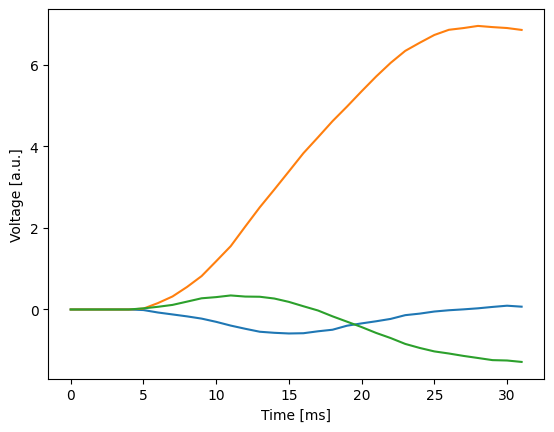

In [ ]:
trained_snn = model.snn.cpu()
trained_readout_voltages = trained_snn(example_input.unsqueeze(1))
plt.plot(trained_readout_voltages.squeeze(1).detach().numpy())

plt.ylabel("Voltage [a.u.]")
plt.xlabel("Time [ms]")
plt.show()

## Algen optimasi

In [ ]:
import torch
import importlib
from norse.torch.module import encode
import random
import numpy as np
import torchvision
from torchvision.datasets import ImageFolder
from norse.torch import LIFParameters, LIFState
from norse.torch.module.lif import LIFCell, LIFRecurrentCell
from norse.torch import LICell, LIState
from norse.torch.module import encode
from typing import NamedTuple
from tqdm.notebook import tqdm, trange
from norse.torch import PoissonEncoder

# Fungsi inisialisasi populasi awal
def initialize_population(population_size):
    population = []
    for _ in range(population_size):
        individual = {
            "T": random.randint(20, 50),
            "LR": round(random.uniform(0.001, 0.01), 5),
            "alpha": random.randint(40, 150),
            "v_th": torch.tensor(round(random.uniform(0.3, 0.7), 2)),
            "HIDDEN_FEATURES": random.randint(50, 200),
            "OUTPUT_FEATURES": 3,
            "BATCH_SIZE": random.randint(16, 64),
            "EPOCHS": random.randint(5, 15),
            "encoder": random.choice([
                encode.SpikeLatencyLIFEncoder,
                encode.ConstantCurrentLIFEncoder,
                encode.PoissonEncoder
            ]),
        }
        population.append(individual)
    return population

# Implementasi Model SNN
class SNNState(NamedTuple):
    lif0: LIFState
    readout: LIState

class SNN(torch.nn.Module):
    def __init__(
        self, input_features, hidden_features, output_features, record=False, dt=0.001
    ):
        super(SNN, self).__init__()
        self.l1 = LIFRecurrentCell(
            input_features,
            hidden_features,
            p=LIFParameters(alpha=100, v_th=torch.tensor(0.5)),
            dt=dt,
        )
        self.input_features = input_features
        self.fc_out = torch.nn.Linear(hidden_features, output_features, bias=False)
        self.out = LICell(dt=dt)

        self.hidden_features = hidden_features
        self.output_features = output_features
        self.record = record

    def forward(self, x):
        seq_length, batch_size, _, _, _ = x.shape
        s1 = so = None
        voltages = []

        if self.record:
            self.recording = SNNState(
                LIFState(
                    z=torch.zeros(seq_length, batch_size, self.hidden_features),
                    v=torch.zeros(seq_length, batch_size, self.hidden_features),
                    i=torch.zeros(seq_length, batch_size, self.hidden_features),
                ),
                LIState(
                    v=torch.zeros(seq_length, batch_size, self.output_features),
                    i=torch.zeros(seq_length, batch_size, self.output_features),
                ),
            )

        for ts in range(seq_length):
            z = x[ts, :, :, :].view(-1, self.input_features)
            z, s1 = self.l1(z, s1)
            z = self.fc_out(z)
            vo, so = self.out(z, so)
            if self.record:
                self.recording.lif0.z[ts, :] = s1.z
                self.recording.lif0.v[ts, :] = s1.v
                self.recording.lif0.i[ts, :] = s1.i
                self.recording.readout.v[ts, :] = so.v
                self.recording.readout.i[ts, :] = so.i
            voltages += [vo]

        return torch.stack(voltages)

# Fungsi dekoder
def decode(x):
    x, _ = torch.max(x, 0)
    log_p_y = torch.nn.functional.log_softmax(x, dim=1)
    return log_p_y

# Fungsi dekoder untuk output terakhir
def decode_last(x):
    x = x[-1]
    log_p_y = torch.nn.functional.log_softmax(x, dim=1)
    return log_p_y

# Implementasi model utama
class Model(torch.nn.Module):
    def __init__(self, encoder, snn, decoder):
        super(Model, self).__init__()
        self.encoder = encoder
        self.snn = snn
        self.decoder = decoder

    def forward(self, x):
        x = self.encoder(x)
        x = self.snn(x)
        log_p_y = self.decoder(x)
        return log_p_y

# Fungsi pembuat data loader
def create_data_loaders(train_path, test_path, individual):
    batch_size = individual["BATCH_SIZE"]  # Menggunakan BATCH_SIZE dari individu
    transform = torchvision.transforms.Compose([
        torchvision.transforms.Grayscale(),
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize(avr_mean, avr_std),
    ])

    train_data = ImageFolder(
        root=train_path,
        transform=transform,
    )

    test_data = ImageFolder(
        root=test_path,
        transform=transform,
    )

    train_loader = torch.utils.data.DataLoader(
        train_data, batch_size=batch_size, shuffle=True
    )

    test_loader = torch.utils.data.DataLoader(
        test_data, batch_size=batch_size, shuffle=True
    )

    return train_loader, test_loader


# Fungsi pembuat model
def create_model(input_features, hidden_features, output_features, seq_length, dt=0.001, encoder=None):
    return Model(
        encoder=encoder(seq_length=seq_length),
        snn=SNN(
            input_features=input_features,
            hidden_features=hidden_features,
            output_features=output_features,
            dt=dt,
        ),
        decoder=decode,
    )




In [ ]:
def evaluate_fitness(model, device, train_loader, test_loader, individual):
    optimizer = torch.optim.Adam(model.parameters(), lr=individual["LR"])
    training_losses = []
    mean_losses = []
    test_losses = []
    accuracies = []

    for epoch in trange(individual["EPOCHS"]):  # Menggunakan EPOCHS dari individu
        training_loss, mean_loss = train(
            model, device, train_loader, optimizer, epoch, max_epochs=individual["EPOCHS"]
        )
        test_loss, accuracy = test(model, device, test_loader, epoch)
        training_losses += training_loss
        mean_losses.append(mean_loss)
        test_losses.append(test_loss)
        accuracies.append(accuracy)

    final_accuracy = accuracies[-1]
    return final_accuracy

In [ ]:

# Fungsi crossover dua titik
def two_point_crossover(parent1, parent2):
    crossover_points = sorted(random.sample(range(len(parent1)), 2))

    child1 = {}
    child2 = {}

    for i in range(len(parent1)):
        if crossover_points[0] < i <= crossover_points[1]:
            child1[list(parent1.keys())[i]], child2[list(parent2.keys())[i]] = parent2[list(parent2.keys())[i]], parent1[list(parent1.keys())[i]]
        else:
            child1[list(parent1.keys())[i]] = parent1[list(parent1.keys())[i]]
            child2[list(parent2.keys())[i]] = parent2[list(parent2.keys())[i]]

    return child1, child2

# Fungsi mutasi
def mutate(individual, mutation_rate=0.2):
    mutated_individual = individual.copy()
    for key, value in mutated_individual.items():
        if random.random() < mutation_rate:
            if key == "T":
                mutated_individual[key] = random.randint(20, 50)
            elif key == "LR":
                mutated_individual[key] = round(random.uniform(0.001, 0.01), 5)
            elif key == "v_th":
                mutated_individual[key] = torch.tensor(round(random.uniform(0.3, 0.7), 2))
            elif key == "HIDDEN_FEATURES":
                mutated_individual[key] = random.randint(50, 200)
            elif key == "OUTPUT_FEATURES":
                mutated_individual[key] = 3
            elif key == "BATCH_SIZE":
                mutated_individual[key] = random.randint(8, 64)
            elif key == "EPOCHS":
                mutated_individual[key] = random.randint(3, 20)
            elif key == "encoder":
                mutated_individual[key] = random.choice([
                    encode.SpikeLatencyLIFEncoder,
                    encode.ConstantCurrentLIFEncoder,
                    encode.PoissonEncoder
                ])
            elif key == "accuracy":
                mutated_individual[key] = 0.0
    return mutated_individual




In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch

def evaluate_confusion_matrix(model, device, test_loader):
    model.eval()
    y_true = []
    y_pred = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            y_true.extend(labels.cpu().numpy())
            y_pred.extend(predicted.cpu().numpy())

    return y_true, y_pred

def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=[0, 1, 2], yticklabels=[0, 1, 2])
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()


In [ ]:
import matplotlib.pyplot as plt

def plot_accuracy_history(accuracies):
    plt.figure(figsize=(10, 6))
    plt.plot(accuracies, marker='o', linestyle='-')
    plt.title('Accuracy History')
    plt.xlabel('Generation')
    plt.ylabel('Accuracy')
    plt.grid(True)
    plt.show()


In [ ]:
def get_best_individual(population):
    best_individual = max(population, key=lambda x: x['accuracy'])
    return best_individual


In [ ]:
def get_best_parameters(model, device, population):
    best_individual = get_best_individual(population)

    # Load model dengan parameter terbaik
    best_model = create_model(
    input_features=128 * 128,
    hidden_features=best_individual["HIDDEN_FEATURES"],
    output_features=3,
    seq_length=best_individual["T"],  # Hapus ini jika tidak ada parameter 'T' di create_model
    dt=0.001,
    encoder=best_individual["encoder"]
)

    best_model.to(device)

    # Evaluasi model dengan data test untuk mendapatkan akurasi
    best_accuracy = evaluate_fitness(best_model, device, train_loader, test_loader, best_individual)


    return best_individual, best_accuracy


In [ ]:
import pickle

In [2]:
# Inisialisasi variabel global population
global_population = []

def train_with_elitism(model, device, train_loader, test_loader, population_size, generations, mutation_rate=0.1):
    global global_population  # Deklarasi variabel global

    # Inisialisasi populasi
    population = initialize_population(population_size)

    for generation in range(generations):
        # Evaluasi fitness untuk setiap individu dalam populasi
        for individual in population:
            # Update model dengan individu saat ini
            current_model = create_model(
                input_features=128 * 128,
                hidden_features=individual["HIDDEN_FEATURES"],
                output_features=3,
                seq_length=individual["T"],
                encoder=individual["encoder"]
            )
            current_model.to(device)
            individual['accuracy'] = evaluate_fitness(current_model, device, train_loader, test_loader, individual)

        # Elitism: Pilih individu terbaik untuk dipertahankan
        best_individual = max(population, key=lambda x: x['accuracy'])

        # Menambahkan akurasi ke dalam list untuk plot
        accuracies.append(best_individual['accuracy'])

        # Cetak akurasi terbaik pada setiap generasi
        print(f"Generation {generation + 1}, Best Accuracy: {best_individual['accuracy']}")

        # Seleksi dan rekombinasi dengan dua-point crossover
        new_population = [best_individual]  # Elitism

        for _ in range(population_size - 1):
            parent1 = max(population, key=lambda x: x['accuracy'])
            parent2 = max(population, key=lambda x: x['accuracy'])
            child1, child2 = two_point_crossover(parent1, parent2)
            child1 = mutate(child1, mutation_rate)
            child2 = mutate(child2, mutation_rate)
            new_population.extend([child1, child2])

        # Update populasi
        population = new_population

    # Pilih individu terbaik setelah semua generasi
    best_individual = max(population, key=lambda x: x['accuracy'])

    # Simpan populasi terakhir ke variabel global
    global_population = population

    # Cetak akurasi terbaik dan confusion matrix
    print(f"Best Accuracy Overall: {best_individual['accuracy']}")

    # Evaluasi model terbaik dengan confusion matrix
    best_model = create_model(
        input_features=128 * 128,
        hidden_features=best_individual["HIDDEN_FEATURES"],
        output_features=3,
        seq_length=best_individual["T"],
        dt=0.001,
        encoder=best_individual["encoder"]
    )
    best_model.to(device)
    best_model.load_state_dict(create_model(
        input_features=128 * 128,
        hidden_features=best_individual["HIDDEN_FEATURES"],
        output_features=3,
        seq_length=best_individual["T"],
        dt=0.001,
        encoder=best_individual["encoder"]
    ).state_dict())

    y_true, y_pred = evaluate_confusion_matrix(best_model, device, test_loader)
    plot_confusion_matrix(y_true, y_pred)

# Tentukan device (CPU atau GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Gunakan fungsi ini untuk melatih model dengan elitism dan mendapatkan confusion matrix
train_with_elitism(Model, device, train_loader, test_loader, population_size=10, generations=4)

# Setelah pelatihan selesai, gunakan fungsi ini untuk mendapatkan parameter terbaik
best_individual, best_accuracy = get_best_parameters(Model, device, global_population)
print("Best Individual:", best_individual)
print("Best Accuracy:", best_accuracy)

In [ ]:
# Setelah semua generasi, tampilkan plot akurasi
plot_accuracy_history(accuracies)

In [ ]:
import matplotlib.pyplot as plt

def plot_accuracy_history2(accuracies):
    plt.figure(figsize=(10, 6))
    plt.plot(accuracies, marker='o', linestyle='-')

    # Menampilkan nilai akurasi pada setiap titik
    for i, acc in enumerate(accuracies):
        plt.text(i, acc, f'{acc:.2f}', ha='left', va='bottom')

    plt.title('Accuracy History')
    plt.xlabel('Generation')
    plt.ylabel('Accuracy')
    plt.grid(True)
    plt.show()


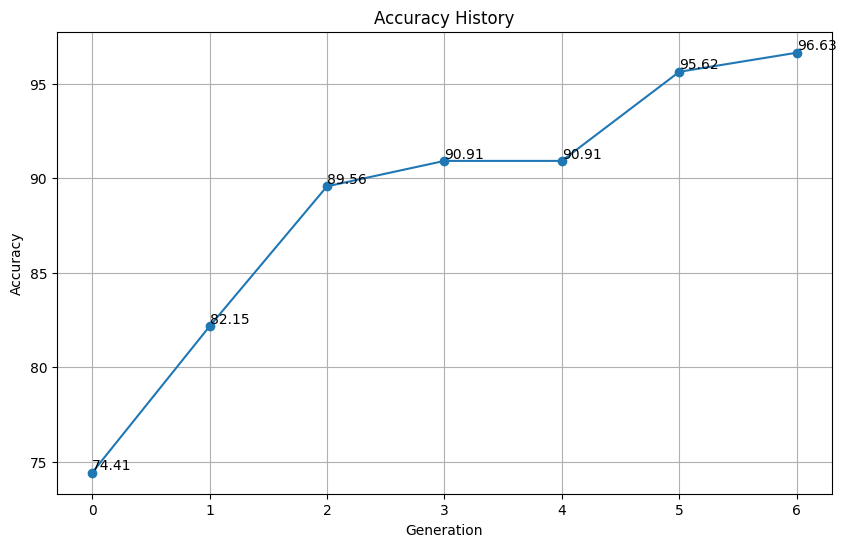

In [ ]:
plot_accuracy_history2(accuracies)

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

Generation 1, Best Accuracy: 93.26599326599326


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

Generation 2, Best Accuracy: 96.29629629629629


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

Generation 3, Best Accuracy: 95.95959595959596


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

Generation 4, Best Accuracy: 95.95959595959596


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

Generation 5, Best Accuracy: 96.29629629629629
Best Accuracy Overall: 96.29629629629629


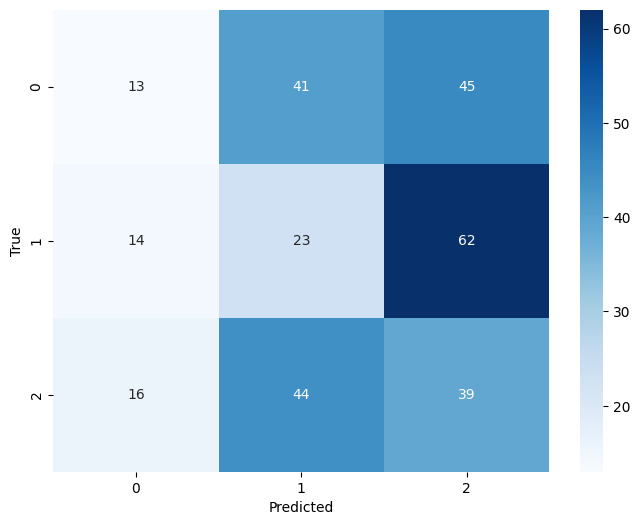

In [ ]:
def train_with_elitism(model, device, train_loader, test_loader, population_size, generations, mutation_rate=0.1):
    # Inisialisasi populasi
    population = initialize_population(population_size)

    for generation in range(generations):
        # Evaluasi fitness untuk setiap individu dalam populasi
        for individual in population:
            # Update model dengan individu saat ini
            current_model = create_model(
                input_features=128 * 128,
                hidden_features=individual["HIDDEN_FEATURES"],
                output_features=3,
                seq_length=individual["T"],
                encoder=individual["encoder"]
            )
            current_model.to(device)
            individual['accuracy'] = evaluate_fitness(current_model, device, train_loader, test_loader, individual)

        # Elitism: Pilih individu terbaik untuk dipertahankan
        best_individual = max(population, key=lambda x: x['accuracy'])

        # Menambahkan akurasi ke dalam list untuk plot
        accuracies.append(best_individual['accuracy'])

        # Cetak akurasi terbaik pada setiap generasi
        print(f"Generation {generation + 1}, Best Accuracy: {best_individual['accuracy']}")

        # Seleksi dan rekombinasi dengan dua-point crossover
        new_population = [best_individual]  # Elitism

        for _ in range(population_size - 1):
            parent1 = max(population, key=lambda x: x['accuracy'])
            parent2 = max(population, key=lambda x: x['accuracy'])
            child1, child2 = two_point_crossover(parent1, parent2)
            child1 = mutate(child1, mutation_rate)
            child2 = mutate(child2, mutation_rate)
            new_population.extend([child1, child2])

        # Update populasi
        population = new_population

    # Pilih individu terbaik setelah semua generasi
    best_individual = max(population, key=lambda x: x['accuracy'])

    # Cetak akurasi terbaik dan confusion matrix
    print(f"Best Accuracy Overall: {best_individual['accuracy']}")

    # Menyimpan populasi ke dalam file pickle
    with open('genetic_algorithm_results.pkl', 'wb') as file:
        pickle.dump(population, file)


    # Evaluasi model terbaik dengan confusion matrix
    best_model = create_model(
        input_features=128 * 128,
        hidden_features=best_individual["HIDDEN_FEATURES"],
        output_features=3,
        seq_length=best_individual["T"],
        dt=0.001,
        encoder=best_individual["encoder"]
    )
    best_model.to(device)
    best_model.load_state_dict(create_model(
        input_features=128 * 128,
        hidden_features=best_individual["HIDDEN_FEATURES"],
        output_features=3,
        seq_length=best_individual["T"],
        dt=0.001,
        encoder=best_individual["encoder"]
    ).state_dict())

    y_true, y_pred = evaluate_confusion_matrix(best_model, device, test_loader)
    plot_confusion_matrix(y_true, y_pred)

# Tentukan device (CPU atau GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Gunakan fungsi ini untuk melatih model dengan elitism dan mendapatkan confusion matrix
train_with_elitism(Model, device, train_loader, test_loader, population_size=10, generations=5)

In [ ]:
# Setelah semua generasi, tampilkan plot akurasi
plot_accuracy_history(accuracies)

In [ ]:
import matplotlib.pyplot as plt

def plot_accuracy_history2(accuracies):
    plt.figure(figsize=(10, 6))
    plt.plot(accuracies, marker='o', linestyle='-')

    # Menampilkan nilai akurasi pada setiap titik
    for i, acc in enumerate(accuracies):
        plt.text(i, acc, f'{acc:.2f}', ha='left', va='bottom')

    plt.title('Accuracy History')
    plt.xlabel('Generation')
    plt.ylabel('Accuracy')
    plt.grid(True)
    plt.show()


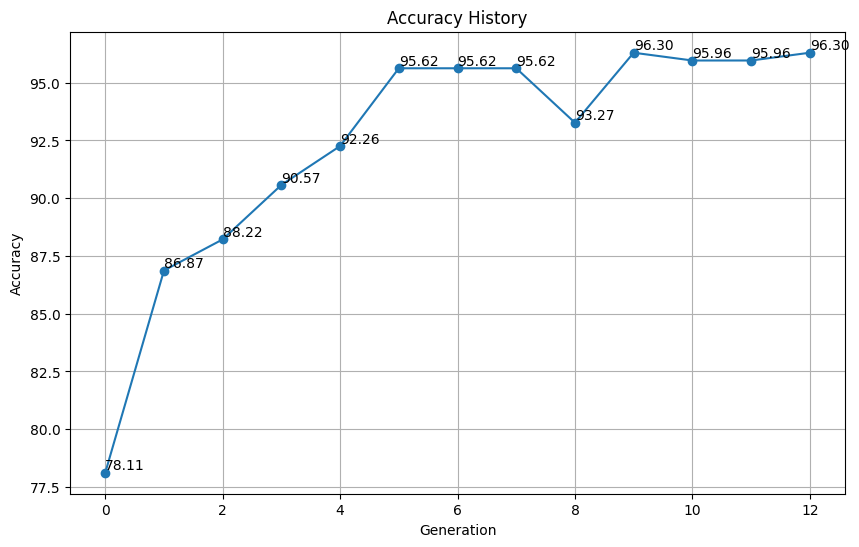

In [ ]:
plot_accuracy_history2(accuracies)

In [ ]:


def train_with_elitism(model, device, train_loader, test_loader, population_size, generations, mutation_rate=0.1):
    # Inisialisasi populasi
    population = initialize_population(population_size)

    for generation in range(generations):
        # Evaluasi fitness untuk setiap individu dalam populasi
        for individual in population:
            # Update model dengan individu saat ini
            current_model = create_model(
                input_features=128 * 128,
                hidden_features=individual["HIDDEN_FEATURES"],
                output_features=3,
                seq_length=individual["T"],
                encoder=individual["encoder"]
            )
            current_model.to(device)
            individual['accuracy'] = evaluate_fitness(current_model, device, train_loader, test_loader, individual)

        # Elitism: Pilih individu terbaik untuk dipertahankan
        best_individual = max(population, key=lambda x: x['accuracy'])

        # Menambahkan akurasi ke dalam list untuk plot
        accuracies.append(best_individual['accuracy'])

        # Cetak akurasi terbaik pada setiap generasi
        print(f"Generation {generation + 1}, Best Accuracy: {best_individual['accuracy']}")

        # Seleksi dan rekombinasi dengan dua-point crossover
        new_population = [best_individual]  # Elitism

        for _ in range(population_size - 1):
            parent1 = max(population, key=lambda x: x['accuracy'])
            parent2 = max(population, key=lambda x: x['accuracy'])
            child1, child2 = two_point_crossover(parent1, parent2)
            child1 = mutate(child1, mutation_rate)
            child2 = mutate(child2, mutation_rate)
            new_population.extend([child1, child2])

        # Update populasi
        population = new_population

    # Pilih individu terbaik setelah semua generasi
    best_individual = max(population, key=lambda x: x['accuracy'])

    # Cetak akurasi terbaik dan confusion matrix
    print(f"Best Accuracy Overall: {best_individual['accuracy']}")

    # Menyimpan populasi ke dalam file pickle
    with open('genetic_algorithm_results.pkl', 'wb') as file:
    pickle.dump(population, file)

    # Evaluasi model terbaik dengan confusion matrix
    best_model = create_model(
        input_features=128 * 128,
        hidden_features=best_individual["HIDDEN_FEATURES"],
        output_features=3,
        seq_length=best_individual["T"],
        dt=0.001,
        encoder=best_individual["encoder"]
    )
    best_model.to(device)
    best_model.load_state_dict(create_model(
        input_features=128 * 128,
        hidden_features=best_individual["HIDDEN_FEATURES"],
        output_features=3,
        seq_length=best_individual["T"],
        dt=0.001,
        encoder=best_individual["encoder"]
    ).state_dict())

    y_true, y_pred = evaluate_confusion_matrix(best_model, device, test_loader)
    plot_confusion_matrix(y_true, y_pred)

## streamlit

In [ ]:
# !pip install streamlit

In [ ]:
# !pip install pyngrok
#

In [ ]:
# !pip install -q streamlit

In [ ]:
# %%writefile utils.py

# # utils.py
# import streamlit as st
# import os
# import matplotlib.pyplot as plt
# from tensorflow.keras.preprocessing import image
# import numpy as np
# import imageio.v2 as imageio
# from datasetapp import display_spike_graph, plot_haemorrhage_images, plot_ischemic_path_images, plot_normal_path_images, display_image_with_axes, plot_haemorrhage_images_aug, plot_ischemic_path_images_aug, plot_normal_path_images_aug


# # Function to display images
# def display_images(image_paths, titles, rows, cols):
#     fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
#     for i, ax in enumerate(axes.flat):
#         img = image.load_img(image_paths[i], target_size=(128, 128))
#         ax.imshow(img)
#         ax.set_title(titles[i])
#         ax.axis('off')
#     st.pyplot(fig)

# def home():
#     st.title("SKRIPSI")
#     st.header("KOMBINASI ALGORITMA GENETIKA DAN SPIKING NEURAL NETWORK MODEL LEAKY INTEGRATED AND FIRE DALAM MENGANALISA CITRA CT SCAN OTAK UNTUK DETEKSI PENYAKIT STROKE")
#     st.subheader('Fabian Domminggus Eka Boro', divider='red')
#     st.caption("4611419060")
#     multi = '''Program Studi Teknik Informatika
#     Fakultas Matematika dan Ilmu Pengetahuan Alam
#     Universitas Negeri Semarang
#     2024
#     '''
#     st.markdown(multi)
# def dataset():
#     st.title("Halaman Dataset")

#     # Menambahkan submenu untuk "Dataset"
#     dataset_submenu = ["sebelum preprocessing", "preprocessing", "denoise", "augmentasi", "encoder"]
#     selected_submenu = st.selectbox("Pilih Submenu", dataset_submenu)

#     if selected_submenu == "sebelum preprocessing":
#         st.write("Konten sebelum preprocessing")
#         st.write("Berikut adalah contoh gambar dari dataset sebelum preprocessing:")
#         st.write("### Haemorrhage Images")
#         plot_haemorrhage_images("/content/dataset-for-stroke-classification/haemorrhagic-stroke")

#         st.write("### Ischemic Images")
#         plot_ischemic_path_images("/content/dataset-for-stroke-classification/ischemic-stroke")

#         st.write("### Normal Images")
#         plot_normal_path_images("/content/dataset-for-stroke-classification/normal")

#     elif selected_submenu == "preprocessing":
#         st.title("Hasil preprocessing")
#         st.header("Resize")
#         multi = '''Dalam melakukan preprocessing dilakukan resize
#         dengan mengonversi semua data menjadi 128 x 128 pixel
#         Kemudian disini dikonversikan juga menjadi data grayscale
#         '''
#         st.markdown(multi)
#         # Tampilkan gambar bersamaan dengan skala kartesius
#         st.image("https://raw.githubusercontent.com/FabianBoro/strokedetection_snn_ga/main/images/resized-image.png")
#         # Tambahkan konten untuk submenu ini sesuai kebutuhan

#     elif selected_submenu == "denoise":
#         st.write("# Hasil Denoise")
#         st.image("https://raw.githubusercontent.com/FabianBoro/strokedetection_snn_ga/main/images/denoise-image.png")

#     elif selected_submenu == "augmentasi":
#         st.write("Data citra augmentasi")
#         st.write("### Haemorrhage Images")
#         plot_haemorrhage_images("/content/dataset-for-stroke-classification/haemorrhagic-stroke")
#         st.write("### Haemorrhage Images Augmented")
#         plot_haemorrhage_images_aug("/content/augmented-dataset/haemorrhagic-stroke")

#         st.write("### Ischemic Images")
#         plot_ischemic_path_images("/content/dataset-for-stroke-classification/ischemic-stroke")
#         st.write("### Ischemic Images Augmented")
#         plot_ischemic_path_images_aug("/content/augmented-dataset/ischemic-stroke")

#         st.write("### Normal Images")
#         plot_normal_path_images("/content/dataset-for-stroke-classification/normal")
#         st.write("### Normal Images Augmented")
#         plot_normal_path_images_aug("/content/augmented-dataset/normal")

#     elif selected_submenu == "encoder":
#         st.write("## encoder")
#         # Pilih encoder type

#         encoder_type = st.selectbox("Pilih Encoder Type", ["ConstantCurrentLIFEncoder", "PoissonEncoder", "SpikeLatencyLIFEncoder"])
#         display_spike_graph(encoder_type)
#         # Tambahkan konten untuk submenu ini sesuai kebutuhan

#         st.write("#### Perbandingan")
#         st.write("#### Constant Current Encoder: Memberikan puncak yang konstan sepanjang waktu tertentu. Merupakan representasi sederhana dan tidak selalu biologis realistis.")
#         st.write("#### Poisson Encoding: Menggunakan pola spike Poisson yang lebih mirip dengan pola aktivitas neuron yang terjadi secara alami. Lebih realistis secara biologis.")
#         st.write("#### Spike Latency Encoding: Memberikan puncak hanya sekali saat input pertama kali mencapai ambang batas. Model ini lebih menekankan pada waktu pertama kali stimulus muncul.")

#     else:
#         # Display information about the dataset
#         for category in os.listdir(dataset_dir):
#             category_path = os.path.join(dataset_dir, category)
#             st.subheader(f"Category: {category}")
#             st.write(f"Number of images: {len(os.listdir(category_path))}")

#             # Display a few sample images
#             sample_images = os.listdir(category_path)[:3]
#             sample_paths = [os.path.join(category_path, img) for img in sample_images]
#             display_images(sample_paths, sample_images, 1, 3)
#             st.write("\n")

# def hasil_akurasi():
#     st.title("Hasil Akurasi")
#     col1, col2 = st.columns(2)
#     with col1:
#         st.header("Akurasi SNN metode LIF")
#         st.image("https://raw.githubusercontent.com/FabianBoro/strokedetection_snn_ga/main/images/akurasi-SNN.png")
#     with col2:
#         st.header("Akurasi kombinasi dengan GA")
#         st.image("https://raw.githubusercontent.com/FabianBoro/strokedetection_snn_ga/main/images/akurasi-GA.png")

#     st.subheader("Akurasi digambarkan dengan hasil SNN dengan metode LIF tanpa menggunakan Algoritma Genetika. Kemudian dengan Algoritma Genetika dioptimasi parameternya sehingga terjadi perulangan pelatihan SNN. Setiap generasi nya diukur dengan confusion matrix")




In [ ]:
# %%writefile datasetapp.py

# # datasetapp.py
# import streamlit as st
# import os
# import matplotlib.pyplot as plt
# from tensorflow.keras.preprocessing import image
# import numpy as np
# import imageio.v2 as imageio
# from PIL import Image

# def plot_haemorrhage_images(folder_path):
#     """Plot 30 slices for the 'haemorrhage' category."""
#     num_rows = 3
#     num_columns = 10
#     factor = 1
#     f, axarr = plt.subplots(
#         num_rows,
#         num_columns,
#         figsize=(num_columns * factor, num_rows * factor),
#     )
#     f.suptitle("Haemorrhage Images", y=1.1)
#     image_id = 0
#     for i in range(num_rows):
#         for j in range(num_columns):
#             image_path = os.path.join(folder_path, f'cerebellar-haemorrhage-5 ({image_id}).png')
#             try:
#                 img = imageio.imread(image_path)
#             except Exception as e:
#                 print(f"Error loading image {image_path}: {e}")
#                 img = np.zeros((2, 2))
#             finally:
#                 axarr[i, j].imshow(img, cmap='gray')
#                 axarr[i, j].axis('off')
#                 image_id += 1
#     plt.subplots_adjust(wspace=0.1, hspace=0.1, left=0, right=1, bottom=0, top=1)
#     st.pyplot(f)

# def plot_haemorrhage_images_aug(folder_path):
#     """Plot 30 slices for the 'haemorrhage' category."""
#     num_rows = 3
#     num_columns = 10
#     factor = 1
#     f, axarr = plt.subplots(
#         num_rows,
#         num_columns,
#         figsize=(num_columns * factor, num_rows * factor),
#     )
#     f.suptitle("Haemorrhage Images", y=1.1)
#     image_id = 0
#     for i in range(num_rows):
#         for j in range(num_columns):
#             image_path = os.path.join(folder_path, f'cerebellar-haemorrhage-5 ({image_id})_rotated.jpg')
#             try:
#                 img = imageio.imread(image_path)
#             except Exception as e:
#                 print(f"Error loading image {image_path}: {e}")
#                 img = np.zeros((2, 2))
#             finally:
#                 axarr[i, j].imshow(img, cmap='gray')
#                 axarr[i, j].axis('off')
#                 image_id += 1
#     plt.subplots_adjust(wspace=0.1, hspace=0.1, left=0, right=1, bottom=0, top=1)
#     st.pyplot(f)

# def plot_ischemic_path_images(folder_path):
#     """Plot 30 slices for the 'haemorrhage' category."""
#     num_rows = 3
#     num_columns = 10
#     factor = 1
#     f, axarr = plt.subplots(
#         num_rows,
#         num_columns,
#         figsize=(num_columns * factor, num_rows * factor),
#     )
#     f.suptitle("Ischemic Images", y=1.1)
#     image_id = 0
#     for i in range(num_rows):
#         for j in range(num_columns):
#             image_path = os.path.join(folder_path, f'ischemic-stroke-2 ({image_id}).jpg')
#             try:
#                 img = imageio.imread(image_path)
#             except Exception as e:
#                 print(f"Error loading image {image_path}: {e}")
#                 img = np.zeros((2, 2))
#             finally:
#                 axarr[i, j].imshow(img, cmap='gray')
#                 axarr[i, j].axis('off')
#                 image_id += 1
#     plt.subplots_adjust(wspace=0.1, hspace=0.1, left=0, right=1, bottom=0, top=1)
#     st.pyplot(f)

# def plot_ischemic_path_images_aug(folder_path):
#     """Plot 30 slices for the 'haemorrhage' category."""
#     num_rows = 3
#     num_columns = 10
#     factor = 1
#     f, axarr = plt.subplots(
#         num_rows,
#         num_columns,
#         figsize=(num_columns * factor, num_rows * factor),
#     )
#     f.suptitle("Ischemic Images", y=1.1)
#     image_id = 0
#     for i in range(num_rows):
#         for j in range(num_columns):
#             image_path = os.path.join(folder_path, f'ischemic-stroke-2 ({image_id})_rotated.jpg')
#             try:
#                 img = imageio.imread(image_path)
#             except Exception as e:
#                 print(f"Error loading image {image_path}: {e}")
#                 img = np.zeros((2, 2))
#             finally:
#                 axarr[i, j].imshow(img, cmap='gray')
#                 axarr[i, j].axis('off')
#                 image_id += 1
#     plt.subplots_adjust(wspace=0.1, hspace=0.1, left=0, right=1, bottom=0, top=1)
#     st.pyplot(f)

# def plot_normal_path_images(folder_path):
#     """Plot 30 slices for the 'haemorrhage' category."""
#     num_rows = 3
#     num_columns = 10
#     factor = 1
#     f, axarr = plt.subplots(
#         num_rows,
#         num_columns,
#         figsize=(num_columns * factor, num_rows * factor),
#     )
#     f.suptitle("Normal Images", y=1.1)
#     image_id = 0
#     for i in range(num_rows):
#         for j in range(num_columns):
#             image_path = os.path.join(folder_path, f'normal-brain-ct-2 ({image_id}).jpeg')
#             try:
#                 img = imageio.imread(image_path)
#             except Exception as e:
#                 print(f"Error loading image {image_path}: {e}")
#                 img = np.zeros((2, 2))
#             finally:
#                 axarr[i, j].imshow(img, cmap='gray')
#                 axarr[i, j].axis('off')
#                 image_id += 1
#     plt.subplots_adjust(wspace=0.1, hspace=0.1, left=0, right=1, bottom=0, top=1)
#     st.pyplot(f)

# def plot_normal_path_images_aug(folder_path):
#     """Plot 30 slices for the 'haemorrhage' category."""
#     num_rows = 3
#     num_columns = 10
#     factor = 1
#     f, axarr = plt.subplots(
#         num_rows,
#         num_columns,
#         figsize=(num_columns * factor, num_rows * factor),
#     )
#     f.suptitle("Normal Images", y=1.1)
#     image_id = 0
#     for i in range(num_rows):
#         for j in range(num_columns):
#             image_path = os.path.join(folder_path, f'normal-brain-ct-2 ({image_id})_rotated.jpg')
#             try:
#                 img = imageio.imread(image_path)
#             except Exception as e:
#                 print(f"Error loading image {image_path}: {e}")
#                 img = np.zeros((2, 2))
#             finally:
#                 axarr[i, j].imshow(img, cmap='gray')
#                 axarr[i, j].axis('off')
#                 image_id += 1
#     plt.subplots_adjust(wspace=0.1, hspace=0.1, left=0, right=1, bottom=0, top=1)
#     st.pyplot(f)

# # Fungsi untuk menampilkan gambar dengan skala kartesius
# def display_image_with_axes(image_path):
#     try:
#         img = Image.imread(image_path)

#         if img is None:
#             raise Exception("Image not loaded successfully.")

#         # Menampilkan gambar dengan skala kartesius
#         st.image(img, caption="Resized Image", use_column_width=True)

#         # Menampilkan skala kartesius
#         st.pyplot(plt.imshow(img, cmap='gray'))
#         st.pyplot(plt.title("Resized Image"))
#         st.pyplot(plt.xlabel("Pixel (X-axis)"))
#         st.pyplot(plt.ylabel("Pixel (Y-axis)"))
#         st.pyplot(plt.grid(True, which='both', linestyle='--', linewidth=0.5))

#     except Exception as e:
#         st.error(f"Error: {e}")

# # Fungsi untuk menampilkan grafik di Streamlit
# def display_spike_graph(encoder_type):

#     if encoder_type == "ConstantCurrentLIFEncoder":
#        col1, col2 = st.columns(2)
#        with col1:
#               st.image("https://raw.githubusercontent.com/FabianBoro/strokedetection_snn_ga/main/images/constantCurrentLIF-encoder.png")
#        with col2:
#               multi = '''ConstantCurrentLIFEncoder dari Norse, yang merupakan suatu cara untuk melakukan encoding data.
#               Encoder ini memperlakukan nilai keabuan (grayscale value) dari suatu gambar sebagai arus konstan untuk menghasilkan puncak (spikes) sebagai
#               input untuk jaringan saraf yang lainnya. Dengan kata lain, setiap nilai keabuan pada gambar dianggap sebagai arus konstan yang dihasilkan
#               oleh suatu neuron.
#               '''
#               st.markdown(multi)


#     elif encoder_type == "PoissonEncoder":
#        col1, col2 = st.columns(2)
#        with col1:
#               st.image("https://raw.githubusercontent.com/FabianBoro/strokedetection_snn_ga/main/images/Poisson-encoder.png")
#        with col2:
#               multi = '''PoissonEncoder dari Norse untuk mengubah data masukan (grayscale input images) menjadi pola spike Poisson. Dalam konteks ini,
#               Poisson spike trains digunakan untuk merepresentasikan bagaimana neuron akan memberikan puncak (spikes) pada waktu tertentu.
#               Berbeda dengan encoding konstan sebelumnya, Poisson encoding lebih sesuai dengan pola aktivitas neuron secara biologis.
#               '''
#               st.markdown(multi)


#     elif encoder_type == "SpikeLatencyLIFEncoder":
#        col1, col2 = st.columns(2)
#        with col1:
#               st.image("https://raw.githubusercontent.com/FabianBoro/strokedetection_snn_ga/main/images/SpikeLatencyLIF-encoder.png")
#        with col2:
#               multi = '''Dalam Spike Latency Encoding, setiap neuron masukan hanya memberikan puncak (spike) satu kali,
#               yaitu saat pertama kali input melewati ambang batas (threshhold).
#               Dengan kata lain, neuron hanya merespons sekali pada saat stimulasi pertama kali mencapai ambang batas tertentu.
#               '''
#               st.markdown(multi)


#     else:
#         st.error("Encoder type not recognized.")
#         return

#     st.pyplot(plt)




In [ ]:
# %%writefile app.py

# # app.py
# import streamlit as st
# import os
# import matplotlib.pyplot as plt
# from tensorflow.keras.preprocessing import image
# import numpy as np
# import imageio.v2 as imageio
# from utils import display_images, home, dataset, hasil_akurasi
# from datasetapp import plot_haemorrhage_images, plot_ischemic_path_images, plot_normal_path_images

# # Path to the extracted dataset
# dataset_dir = "/content/dataset-for-stroke-classification"


# # Mendefinisikan layout
# st.set_page_config(
#     page_title="Hasil Stroke Detection",
#     page_icon=":rocket:",
#     layout="wide"
# )

# # Menambahkan HTML dan CSS untuk menata tata letak logo dan menu
# st.markdown(
#     """
#     <style>
#         .stApp {
#             bottom: 0;
#         }
#         .css-1aumxhk {
#             flex-direction: row-reverse;
#             justify-content: space-between;
#             padding: 0 1rem;
#         }
#         .css-15n8g2a {
#             list-style-type: none;
#             margin: 0;
#             padding: 0;
#             display: flex;
#         }
#         .css-1rb5m7v {
#             margin-right: 1rem;
#         }
#         .css-1l02zno {
#             order: -1;
#         }
#     </style>
#     """,
#     unsafe_allow_html=True
# )
# st.image("https://raw.githubusercontent.com/FabianBoro/strokedetection_snn_ga/main/Logo-univ.png", width=100)
# st.title("_______________")
# # Tempat code sidebar
# with st.sidebar:
#     st.markdown(
#         """
#         <style>
#             .sidebar-content {
#                 display: flex;
#                 flex-direction: column;
#                 align-items: center;
#                 text-align: center;
#             }

#             .centered-image {
#                 margin-left: auto;
#                 margin-right: auto;
#             }
#         </style>
#         """,
#         unsafe_allow_html=True
#     )

#     # Menambahkan menu list pada navbar

#     menu_list = ["Home", "Dataset", "Model", "Hasil Akurasi", "About"]
#     selected_menu = st.sidebar.selectbox("-Menu-",menu_list)


# # Konten aplikasi di tengah halaman
# if selected_menu == "Home":
#     home()
# elif selected_menu == "Dataset":
#     dataset()
# elif selected_menu == "Model":
#     # Tambahkan konten untuk halaman Model di sini
#     st.title("Halaman Model")
# elif selected_menu == "Hasil Akurasi":
#     hasil_akurasi()
#     # Tambahkan konten untuk halaman Hasil Akurasi di sini
#     st.title("Halaman Hasil Akurasi")
# elif selected_menu == "About":
#     # Tambahkan konten untuk halaman About di sini
#     st.title("Halaman About")



In [ ]:
# !npm install localtunnel

In [ ]:
# !streamlit run app.py &>/content/logs.txt & npx localtunnel --port 8501 & curl ipv4.icanhazip.com

35.204.11.37

In [ ]:
# !streamlit run app.py &>/content/logs.txt &

In [ ]:
# # app.py
# import streamlit as st

# def main():
#     st.title("Aplikasi Streamlit di Google Colab")
#     st.write("Ini adalah contoh aplikasi Streamlit di Colab.")

# if __name__ == "__main__":
#     main()


In [ ]:
# streamlit run /usr/local/lib/python3.10/dist-packages/colab_kernel_launcher.py

In [ ]:
# !streamlit run app.py &

# # Tambahkan ngrok (jika Anda ingin mendapatkan URL publik)
# from pyngrok import ngrok
# ngrok_url = ngrok.connect(port='8501')
# ngrok_url


## UI

In [ ]:
# !pip install Flask

In [ ]:
# !pip install flask-ngrok

In [ ]:
# from flask import Flask, render_template
# from flask_ngrok import run_with_ngrok

# app = Flask(__name__)
# run_with_ngrok(app)  # Inisialisasi ngrok di aplikasi Flask

# @app.route('/')
# def home():
#     return render_template('home.html')

# # Tambahkan rute dan halaman-halaman lainnya
# !wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
# !unzip ngrok-stable-linux-amd64.zip
# get_ipython().system_raw('./ngrok http 5000 &')

# if __name__ == '__main__':
#     app.run()


In [ ]:
# # Install ngrok
# !wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
# !unzip ngrok-stable-linux-amd64.zip

# # Run ngrok
# get_ipython().system_raw('./ngrok http 5000 &')


In [ ]:
# from flask import Flask, render_template
# from flask_ngrok import run_with_ngrok

# app = Flask(__name__)
# run_with_ngrok(app)  # Inisialisasi ngrok di aplikasi Flask

# @app.route('/')
# def home():
#     return render_template('home.html')

# # Tambahkan rute dan halaman-halaman lainnya

# if __name__ == '__main__':
#     app.run()
